# **Bulid YourSelf - WEEK - 1**

**Question - 1**

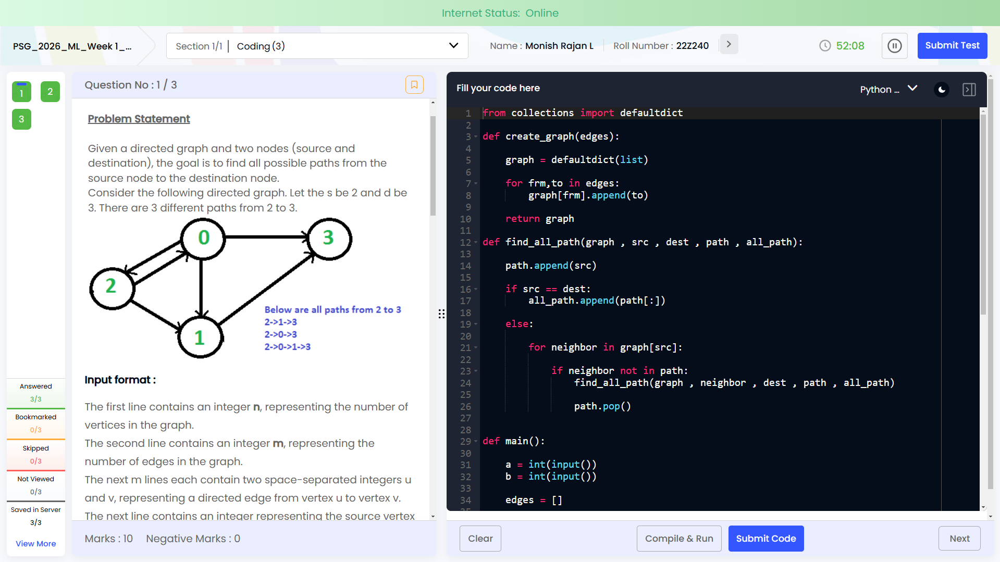

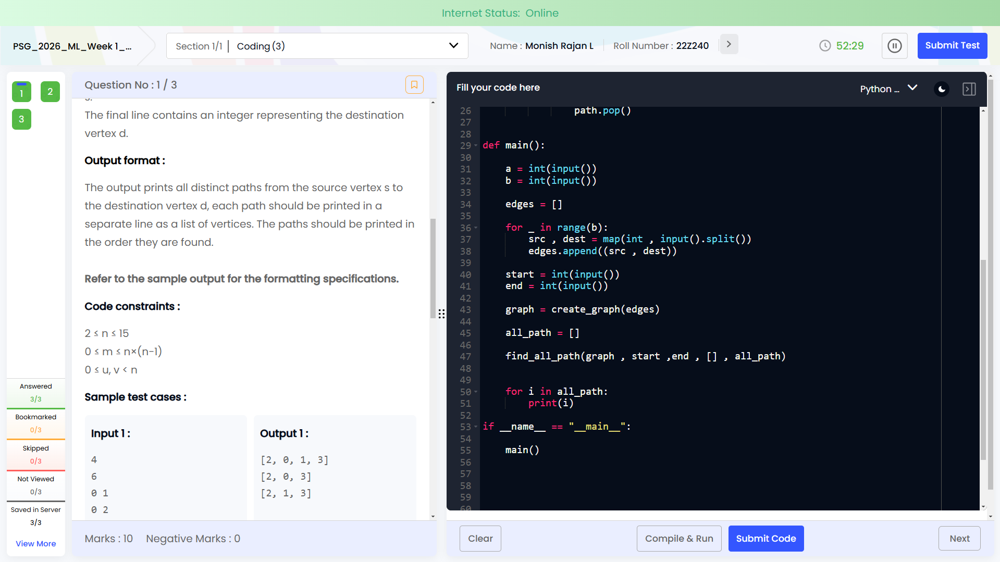

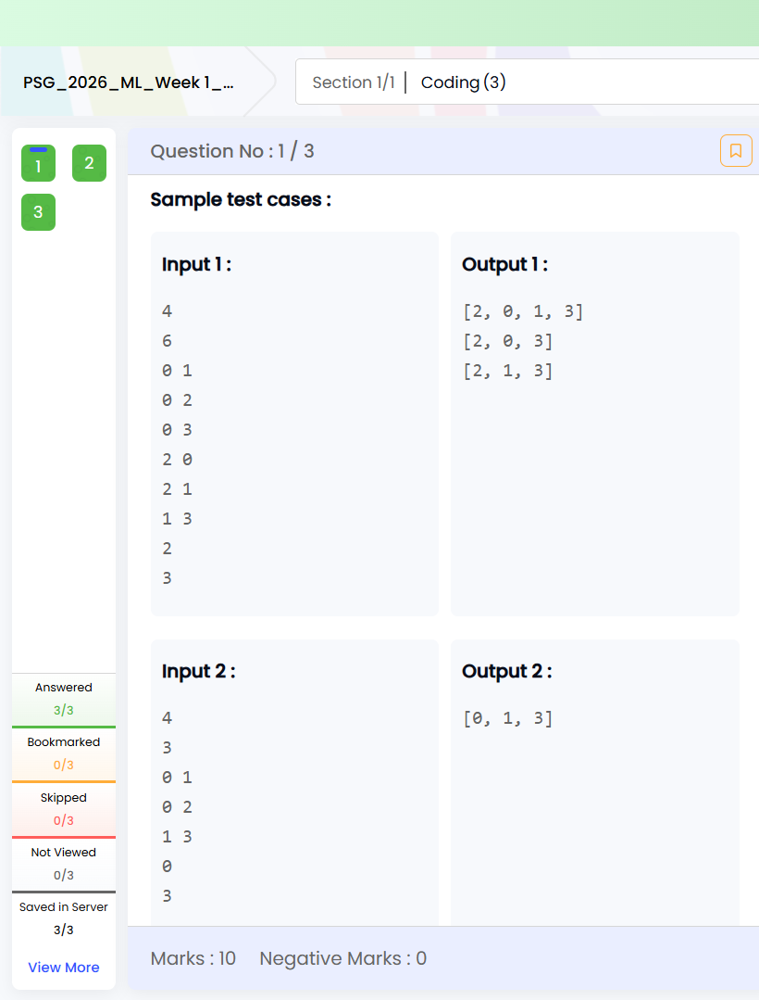


In [ ]:
# This is code for above Question

from collections import defaultdict

def create_graph(edges):
    graph = defaultdict(list)

    for frm , to in edges:
      graph[frm].append(to)

    return graph

def find_all_path(graph, src , dest , path , all_path):
  path.append(src)

  if src == dest:
    all_path.append(path.copy())
  else:
    for node in graph[src]:
      if node not in path:
        find_all_path(graph, node, dest, path, all_path)

        path.pop()

def main():

  a = int(input())
  b = int(input())

  edges = []

  for _ in range(b):
    src , dest = map(int , input().split())
    edges.append((src, dest))

  graph = create_graph(edges)

  start = int(input())
  end = int(input())

  all_path = []

  find_all_path(graph, start, end, [], all_path)

  for i in all_path:
    print(i)

if __name__ == "__main__":
  main()

4
6
0 1
0 2
0 3
2 0
2 1
1 3
2
3
[2, 0, 1, 3]
[2, 0, 3]
[2, 1, 3]


**Qustion 2**

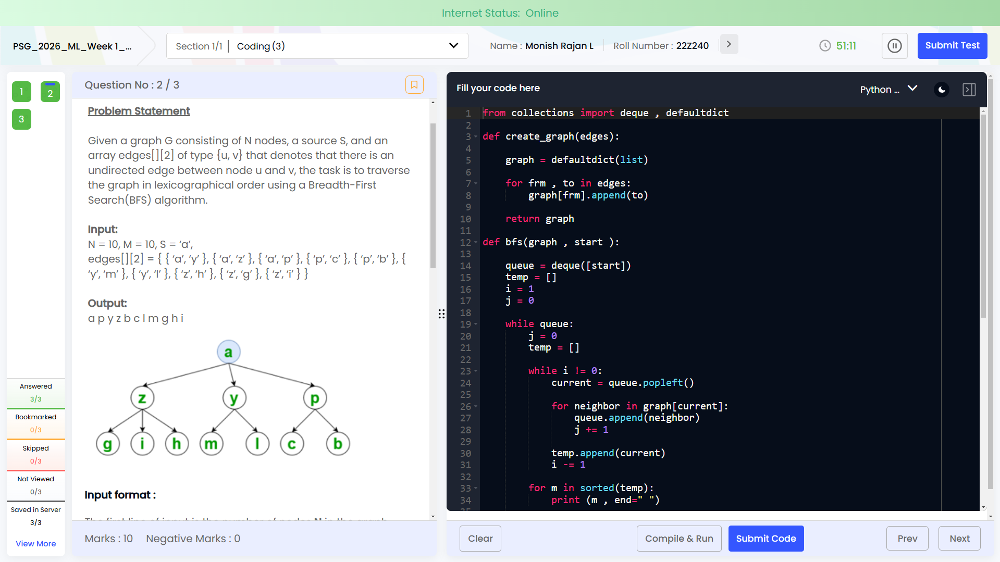
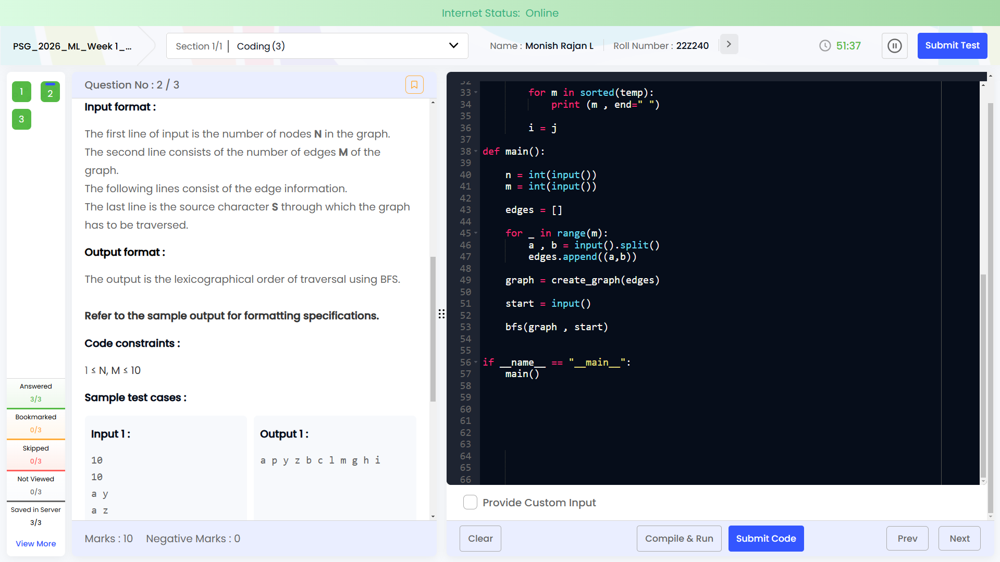
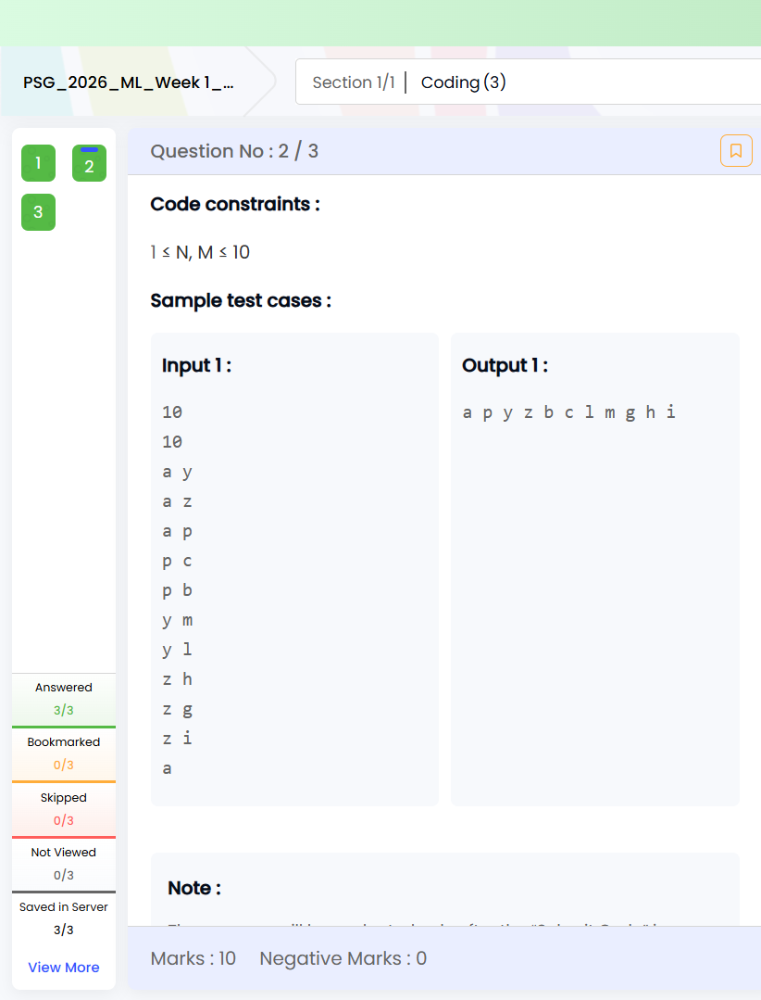


In [ ]:
from collections import defaultdict, deque

def create_graph(edges):
    graph = defaultdict(list)

    for frm, to in edges:
        graph[frm].append(to)

    return graph

def bfs(graph, start):
    queue = deque([start])

    while queue:
        level_size = len(queue)
        temp = []

        for _ in range(level_size):
            current = queue.popleft()
            temp.append(current)
            for neighbor in graph[current]:
                queue.append(neighbor)

        for node in sorted(temp):
            print(node, end=" ")

def main():
    n = int(input("Enter number of nodes: "))
    m = int(input("Enter number of edges: "))

    edges = []
    for _ in range(m):
        a, b = input("Enter edge (from to): ").split()
        edges.append((a, b))

    graph = create_graph(edges)
    start = input("Enter the start node: ")

    bfs(graph, start)

if __name__ == "__main__":
    main()


Enter number of nodes: 10
Enter number of edges: 10
Enter edge (from to): a y
Enter edge (from to): a z
Enter edge (from to): a p
Enter edge (from to): p c
Enter edge (from to): p b
Enter edge (from to): y m 
Enter edge (from to): y l
Enter edge (from to): z h
Enter edge (from to): z g
Enter edge (from to): z i
Enter the start node: a
a 
p y z 
b c g h i l m 


**Question 3**
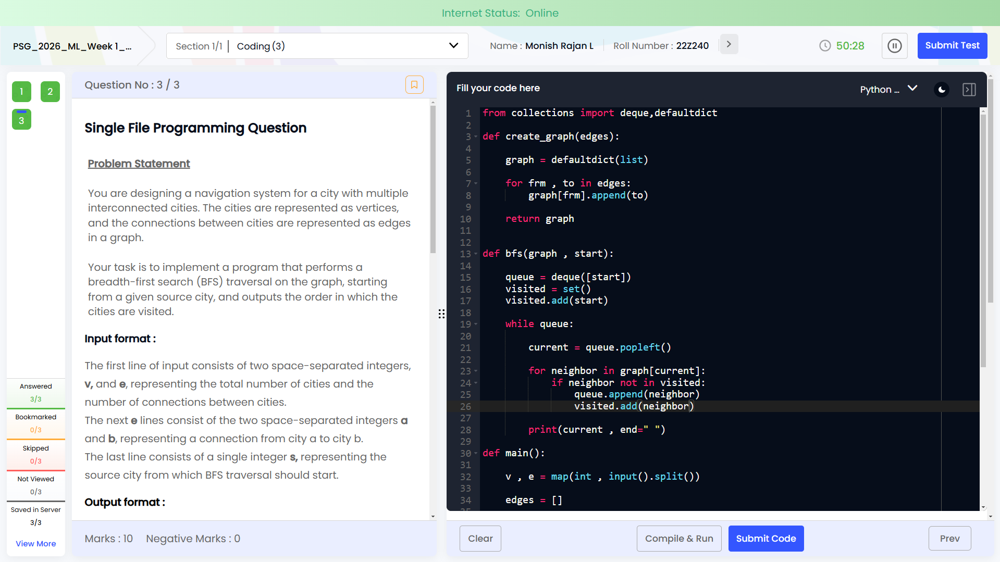
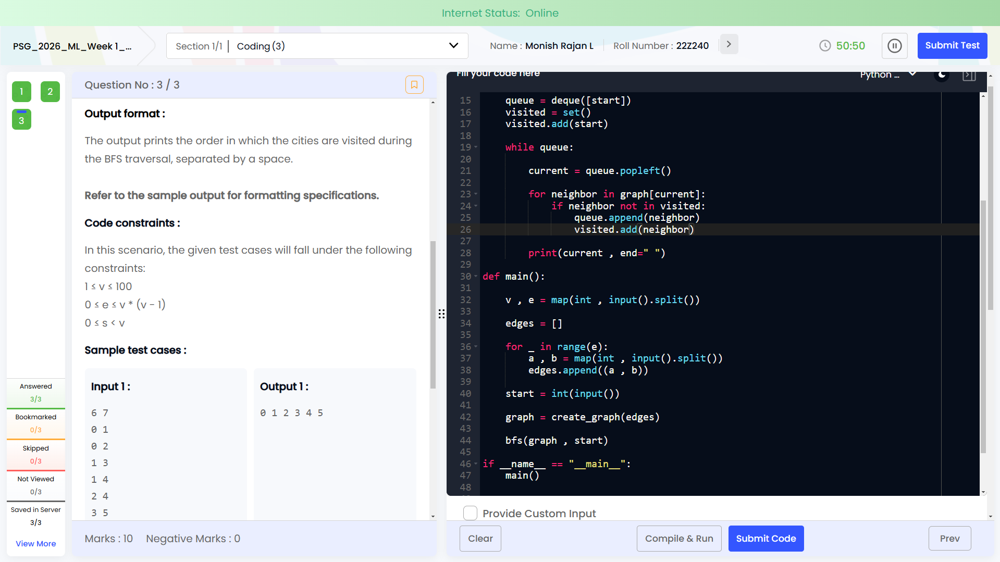

In [ ]:
from collections import deque , defaultdict

def create_graph(edges):
    graph = defaultdict(list)

    for frm, to in edges:
        graph[frm].append(to)

    return graph

def bfs(graph, start):
    visited = set()
    queue = deque([start])
    visited.add(start)

    while queue:

      current = queue.popleft()

      for neighbor in graph[current]:
        if neighbor not in visited:
          queue.append(neighbor)
          visited.add(neighbor)

      print(current , end=" ")

def main():
    v , e = map(int , input().split())

    edges = []
    for _ in range(e):
        a, b = map(int , input().split())
        edges.append((a, b))

    graph = create_graph(edges)

    start = int(input())

    bfs(graph, start)

if __name__ == "__main__":
    main()




6 7
0 1
0 2
1 3
1 4
2 4
3 5
4  5
0
0 1 2 3 4 5 

# **Challenge Yourself - WEEK - 1**

**Question - 1**

In [ ]:
class Solution:
    def __init__(self , board):
      self.max1 = 0
      self.board = board
      self.rows = len(board)
      self.cols = len(board[0])
      self.directions = [(-1 , -1) , (-1 , 0) , (-1 , 1) , (0 , 1) , (1 , 1) , (1 , 0) , (1 , -1) , (0 , -1)] # directions
      self.visited = set()

    def is_Valid(self , next_x , next_y , current_char):
      return 0 <= next_x < self.rows and 0 <= next_y < self.cols and ord(self.board[next_x][next_y]) == ord(current_char) + 1

    def dfs(self , count , i , j ):
      flag = 1

      for dx,dy in self.directions:
        next_x , next_y = i + dx , j + dy
        if (next_x , next_y) not in self.visited and self.is_Valid(next_x , next_y , self.board[i][j]):
          self.visited.add((next_x , next_y))
          self.dfs(count +  1 , next_x , next_y)
          self.visited.remove((next_x , next_y))
          flag = 0

      if flag:
        self.max1 = max(self.max1 , count)

      return

    def pick_char(self , char1 ):
      for i in range(self.rows):
        for j in range(self.cols):
          if self.board[i][j] == char1:
            self.visited.add((i , j))
            self.dfs(1 , i , j)

    def answer(self):
      return self.max1


if __name__ == "__main__":

  board = [
      ['D' , 'E' , 'H' , 'X' , 'B'],
      ['A' , 'O' , 'G' , 'P' , 'E'],
      ['D' , 'D' , 'C' , 'F' , 'D'],
      ['E' , 'B' , 'E' , 'A' , 'S'],
      ['C' , 'D' , 'Y' , 'E' , 'N']
  ]

  solution = Solution(board)

  solution.pick_char('C')

  print(solution.answer())




6


**Question - 2**

In [ ]:
# Answer for the Second Question is the longest path . It is nothing but the (row * col) , This is applicable only when there is no wall in the grid( which we basically represent in 1 ).

# Or else we can use DFS to check the longest path , One case will be stated as "Time Limit Exceeded". To Overcome that We need to use DP(Dynamic Programing) to solve this particular Problem.


# **Build Yourself - WEEK - 2**


**Question 1**

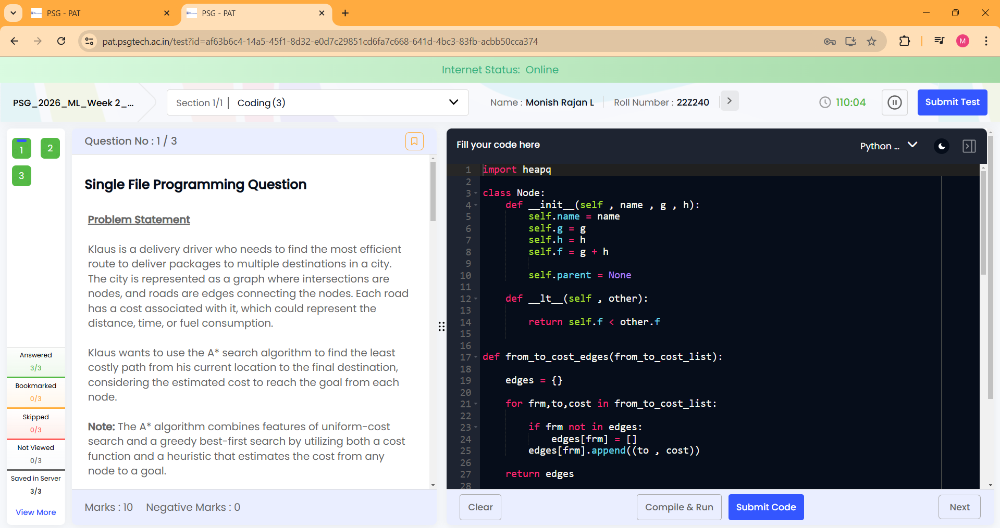

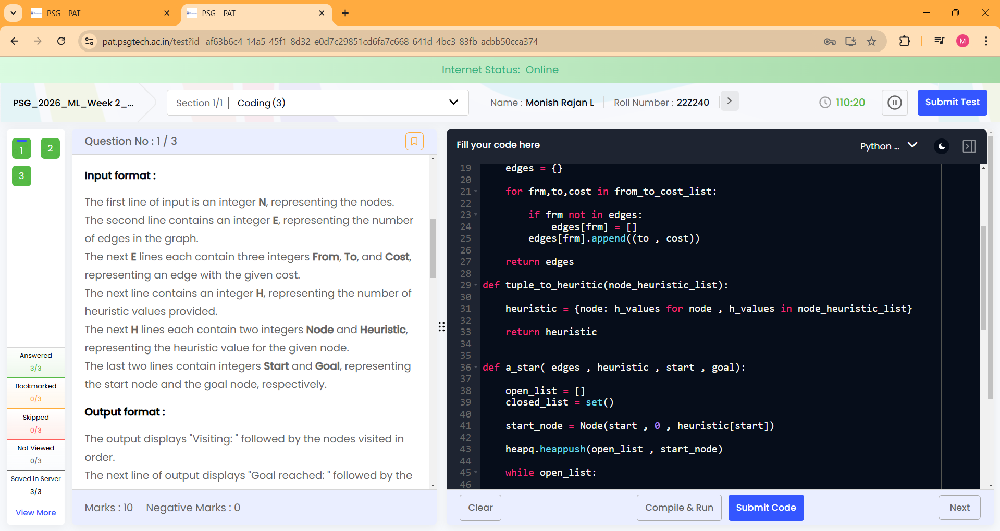

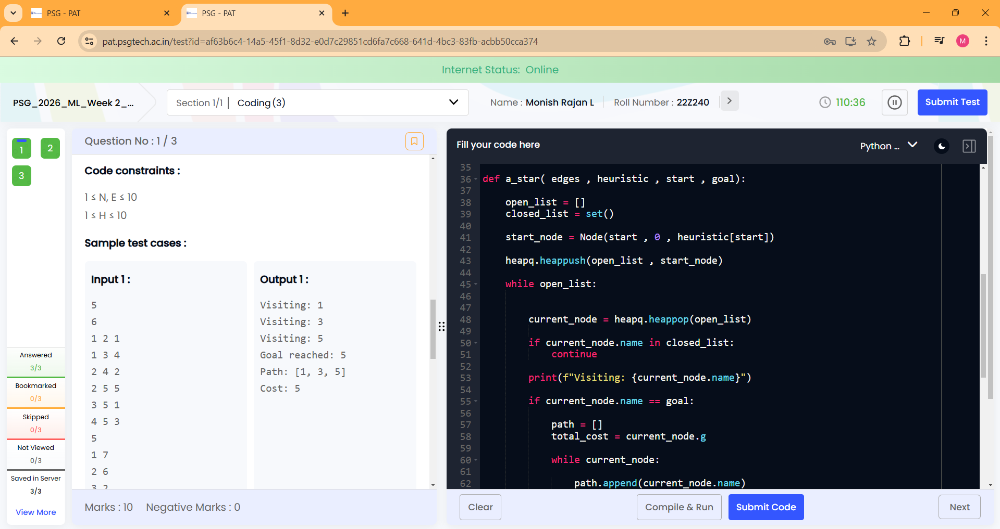

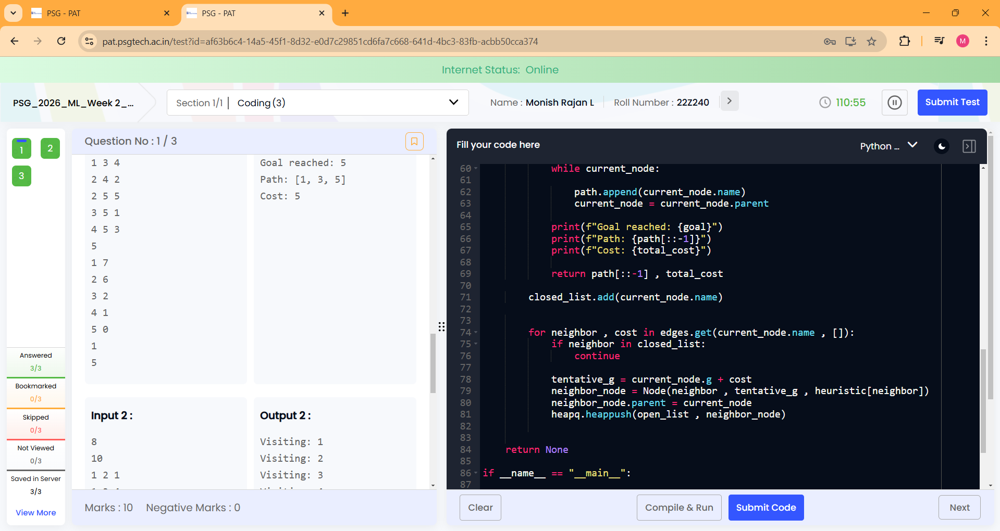

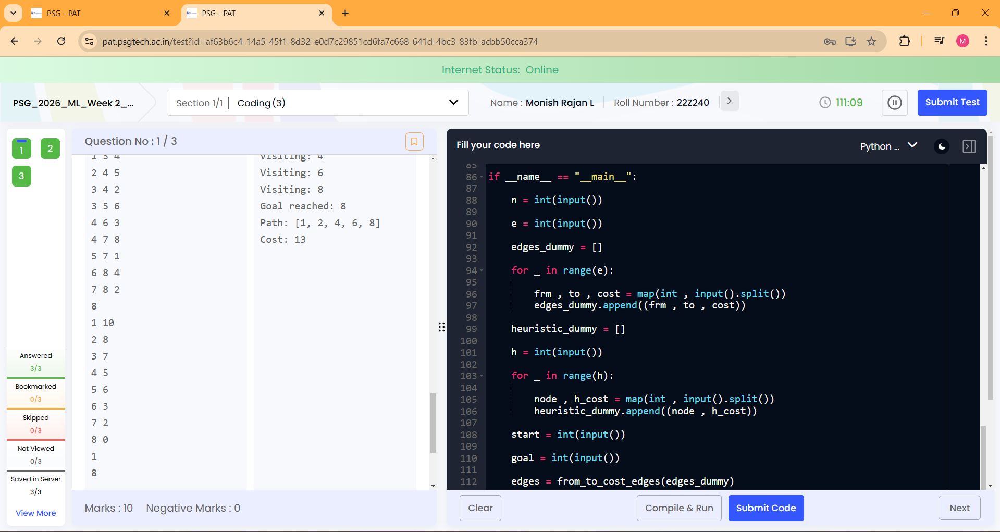



In [ ]:
import heapq

class Node:
    def __init__(self , name , g , h):
        self.name = name
        self.g = g
        self.h = h
        self.f = g + h

        self.parent = None

    def __lt__(self , other):

        return self.f < other.f


def from_to_cost_edges(from_to_cost_list):

    edges = {}

    for frm,to,cost in from_to_cost_list:

        if frm not in edges:
            edges[frm] = []
        edges[frm].append((to , cost))

    return edges

def tuple_to_heuritic(node_heuristic_list):

    heuristic = {node: h_values for node , h_values in node_heuristic_list}

    return heuristic


def a_star( edges , heuristic , start , goal):

    open_list = []
    closed_list = set()

    start_node = Node(start , 0 , heuristic[start])

    heapq.heappush(open_list , start_node)

    while open_list:


        current_node = heapq.heappop(open_list)

        if current_node.name in closed_list:
            continue

        print(f"Visiting: {current_node.name}")

        if current_node.name == goal:

            path = []
            total_cost = current_node.g

            while current_node:

                path.append(current_node.name)
                current_node = current_node.parent

            print(f"Goal reached: {goal}")
            print(f"Path: {path[::-1]}")
            print(f"Cost: {total_cost}")

            return path[::-1] , total_cost

        closed_list.add(current_node.name)


        for neighbor , cost in edges.get(current_node.name , []):
            if neighbor in closed_list:
                continue

            tentative_g = current_node.g + cost
            neighbor_node = Node(neighbor , tentative_g , heuristic[neighbor])
            neighbor_node.parent = current_node
            heapq.heappush(open_list , neighbor_node)


    return None

if __name__ == "__main__":

    n = int(input())

    e = int(input())

    edges_dummy = []

    for _ in range(e):

        frm , to , cost = map(int , input().split())
        edges_dummy.append((frm , to , cost))

    heuristic_dummy = []

    h = int(input())

    for _ in range(h):

        node , h_cost = map(int , input().split())
        heuristic_dummy.append((node , h_cost))

    start = int(input())

    goal = int(input())

    edges = from_to_cost_edges(edges_dummy)

    heuristic = tuple_to_heuritic(heuristic_dummy)

    shortest_path , total_cost = a_star( edges , heuristic , start , goal)

**Question 2**

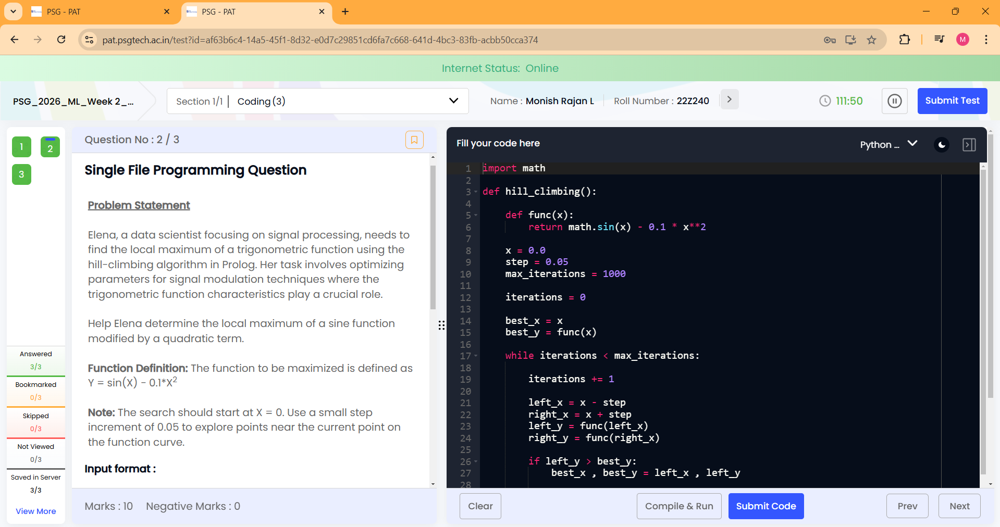

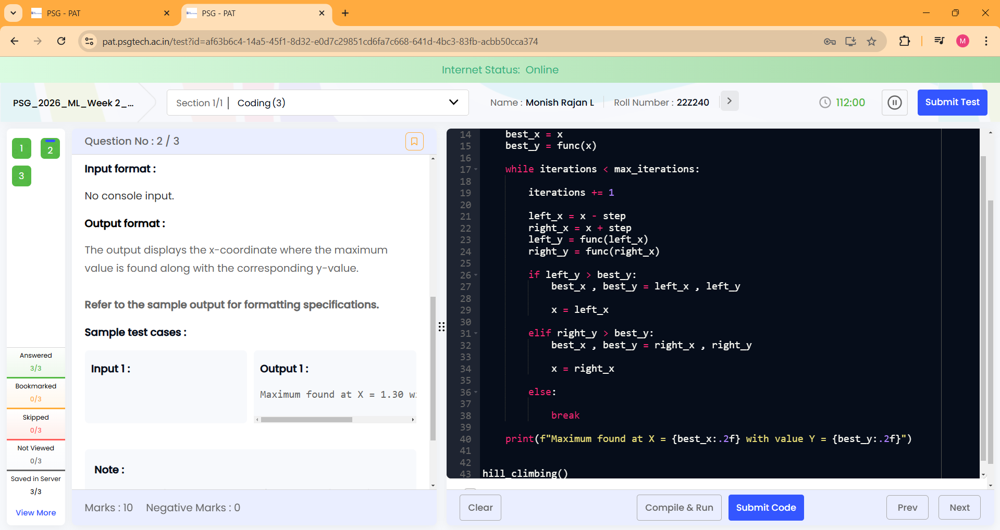


In [ ]:
import math

def hill_climbing():

    def func(x):
        return math.sin(x) - 0.1 * x**2

    x = 0.0
    step = 0.05
    max_iterations = 1000

    iterations = 0

    best_x = x
    best_y = func(x)

    while iterations < max_iterations:

        iterations += 1

        left_x = x - step
        right_x = x + step
        left_y = func(left_x)
        right_y = func(right_x)

        if left_y > best_y:
            best_x , best_y = left_x , left_y

            x = left_x

        elif right_y > best_y:
            best_x , best_y = right_x , right_y
            x = right_x

        else:

            break

    print(f"Maximum found at X = {best_x:.2f} with value Y = {best_y:.2f}")


hill_climbing()


Maximum found at X = 1.30 with value Y = 0.79


**Qustion 3**

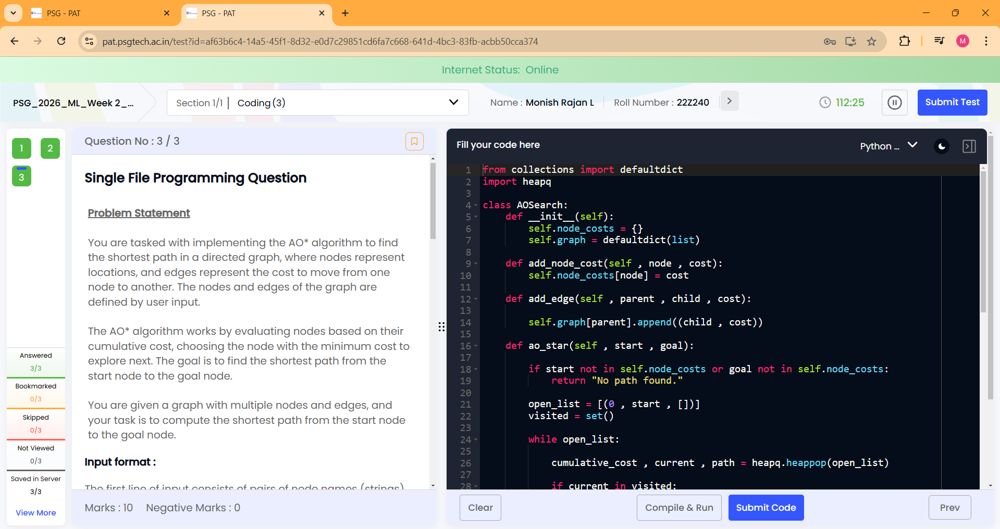

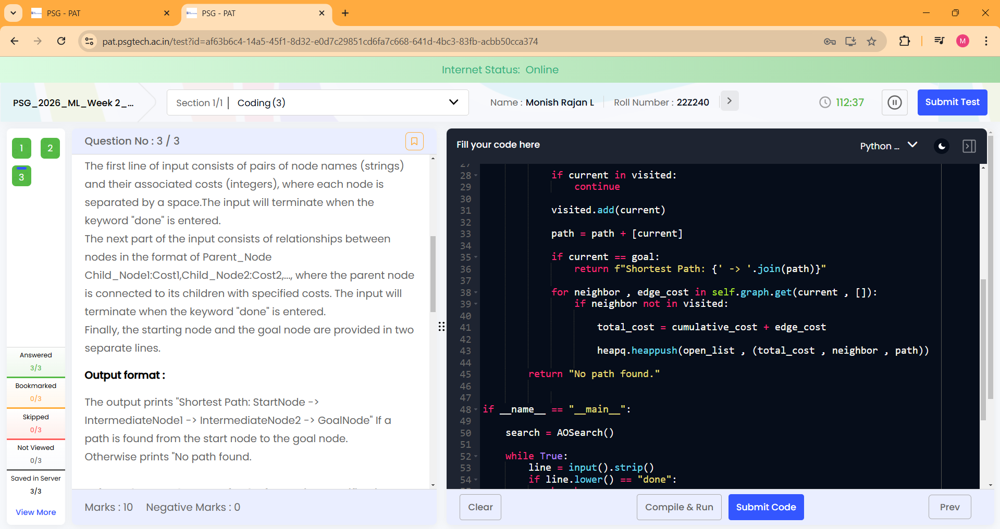

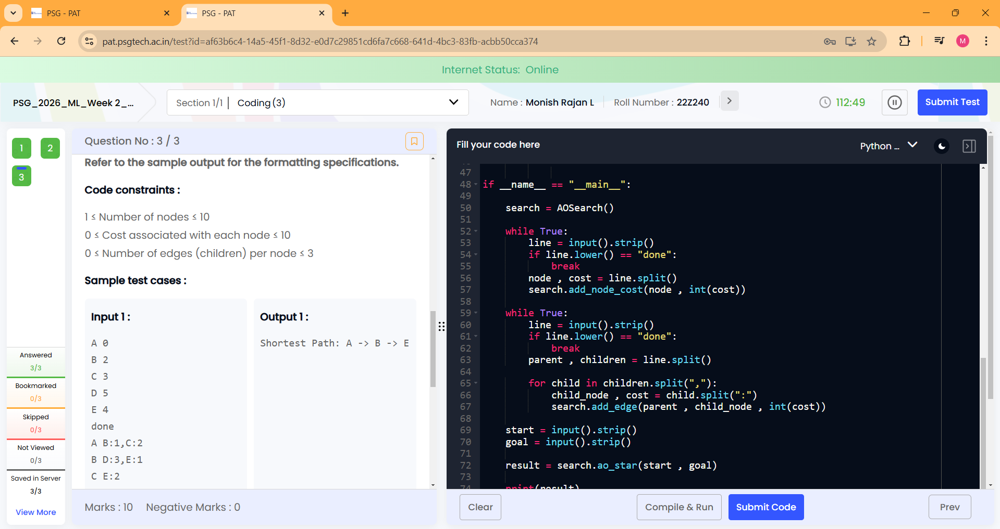

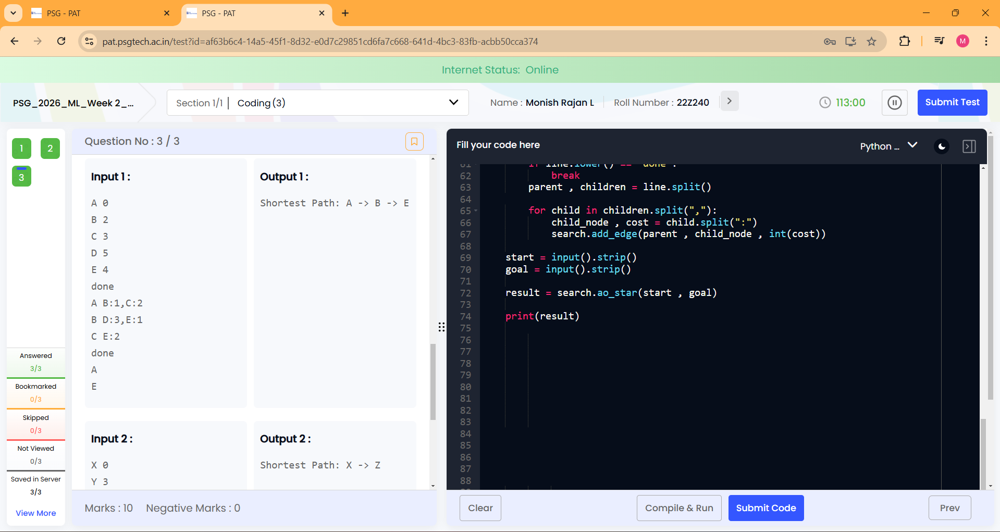



In [1]:
from collections import defaultdict
import heapq

class AOSearch:
    def __init__(self):
        self.node_costs = {}
        self.graph = defaultdict(list)

    def add_node_cost(self , node , cost):
        self.node_costs[node] = cost

    def add_edge(self , parent , child , cost):

        self.graph[parent].append((child , cost))

    def ao_star(self , start , goal):

        if start not in self.node_costs or goal not in self.node_costs:
            return "No path found."

        open_list = [(0 , start , [])]
        visited = set()

        while open_list:

            cumulative_cost , current , path = heapq.heappop(open_list)

            if current in visited:
                continue

            visited.add(current)

            path = path + [current]

            if current == goal:
                return f"Shortest Path: {' -> '.join(path)}"

            for neighbor , edge_cost in self.graph.get(current , []):
                if neighbor not in visited:

                    total_cost = cumulative_cost + edge_cost

                    heapq.heappush(open_list , (total_cost , neighbor , path))

        return "No path found."


if __name__ == "__main__":

    search = AOSearch()

    while True:
        line = input().strip()
        if line.lower() == "done":
            break
        node , cost = line.split()
        search.add_node_cost(node , int(cost))

    while True:
        line = input().strip()
        if line.lower() == "done":
            break
        parent , children = line.split()

        for child in children.split(","):
            child_node , cost = child.split(":")
            search.add_edge(parent , child_node , int(cost))

    start = input().strip()
    goal = input().strip()

    result = search.ao_star(start , goal)

    print(result)

A 0
B 2
C 3
D 5
E 4
done
A B:1,C:2
B D:3,E:1
C E:2
done
A
E
Shortest Path: A -> B -> E


#**Challenge YourSelf - WEEK - 2**
**Question - 2**

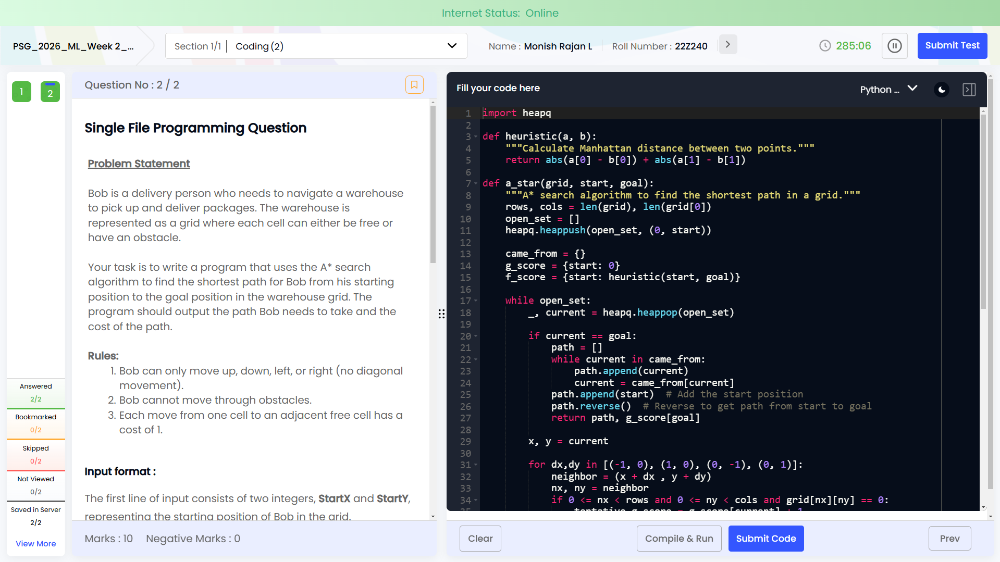

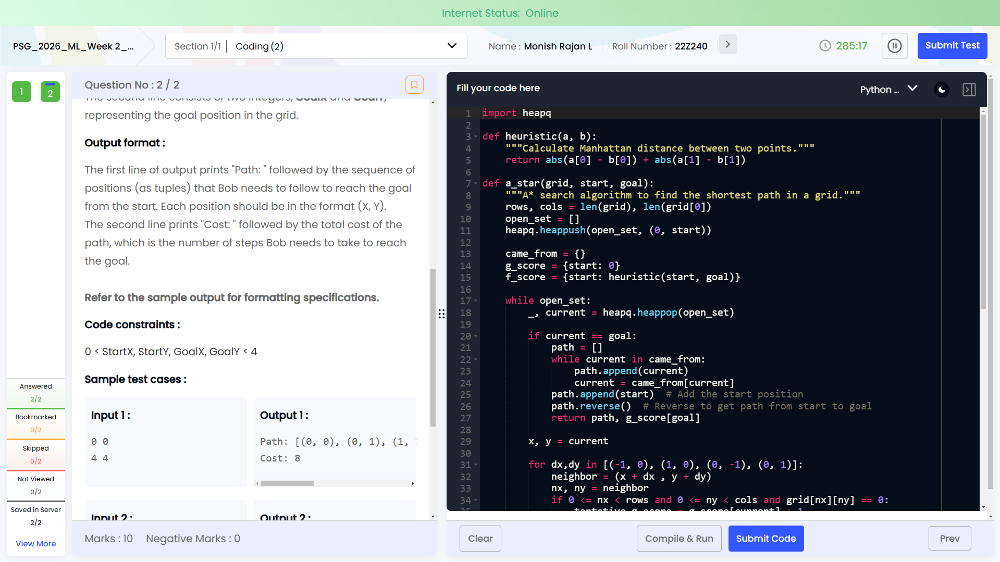

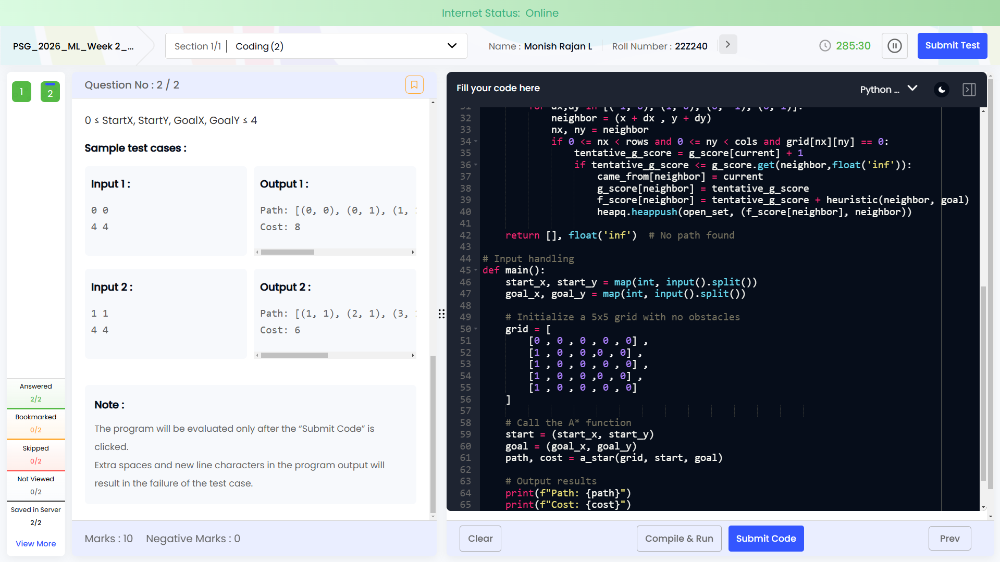


In [ ]:
import heapq

def heuristic(a, b):
    """Calculate Manhattan distance between two points."""
    return abs(a[0] - b[0]) + abs(a[1] - b[1])

def a_star(grid, start, goal):
    """A* search algorithm to find the shortest path in a grid."""
    rows, cols = len(grid), len(grid[0])
    open_set = []
    heapq.heappush(open_set, (0, start))

    came_from = {}
    g_score = {start: 0}
    f_score = {start: heuristic(start, goal)}

    while open_set:
        _, current = heapq.heappop(open_set)

        if current == goal:
            path = []
            while current in came_from:
                path.append(current)
                current = came_from[current]
            path.append(start)  # Add the start position
            path.reverse()  # Reverse to get path from start to goal
            return path, g_score[goal]

        x, y = current

        for dx,dy in [(-1, 0), (1, 0), (0, -1), (0, 1)]:
            neighbor = (x + dx , y + dy)
            nx, ny = neighbor
            if 0 <= nx < rows and 0 <= ny < cols and grid[nx][ny] == 0:
                tentative_g_score = g_score[current] + 1
                if tentative_g_score <= g_score.get(neighbor,float('inf')):
                    came_from[neighbor] = current
                    g_score[neighbor] = tentative_g_score
                    f_score[neighbor] = tentative_g_score + heuristic(neighbor, goal)
                    heapq.heappush(open_set, (f_score[neighbor], neighbor))

    return [], float('inf')  # No path found

# Input handling
def main():
    start_x, start_y = map(int, input().split())
    goal_x, goal_y = map(int, input().split())

    # Initialize a 5x5 grid with no obstacles
    grid = [
        [0 , 0 , 0 , 0 , 0] ,
        [1 , 0 , 0 ,0 , 0] ,
        [1 , 0 , 0 , 0 , 0] ,
        [1 , 0 , 0 ,0 , 0] ,
        [1 , 0 , 0 , 0 , 0]
    ]

    # Call the A* function
    start = (start_x, start_y)
    goal = (goal_x, goal_y)
    path, cost = a_star(grid, start, goal)

    # Output results
    print(f"Path: {path}")
    print(f"Cost: {cost}")

if __name__ == "__main__":
    main()


**Question - 2**

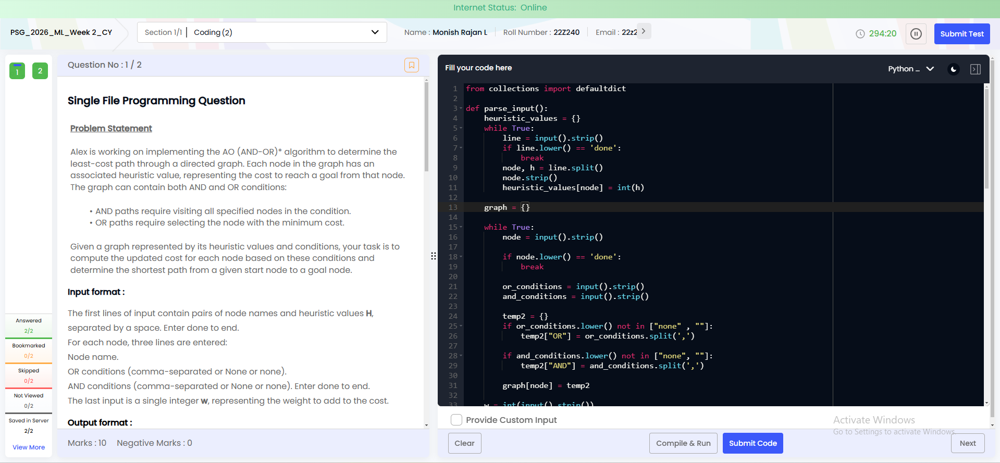

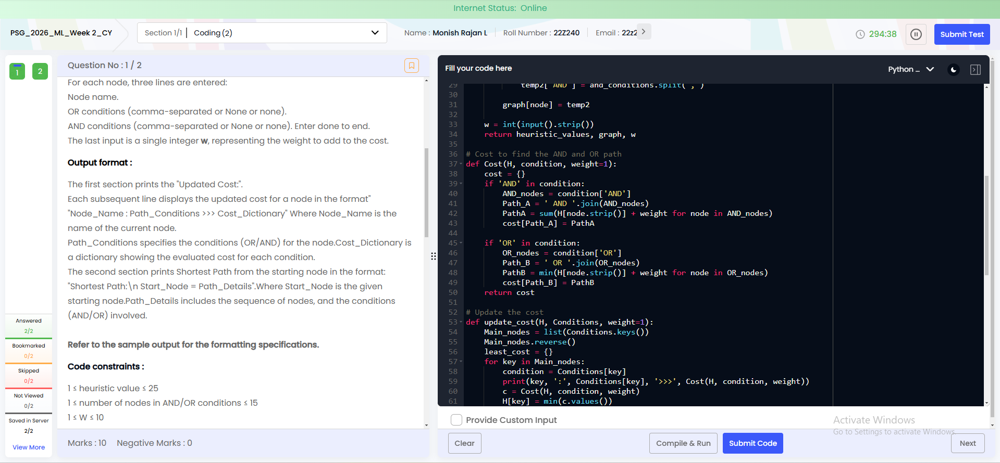

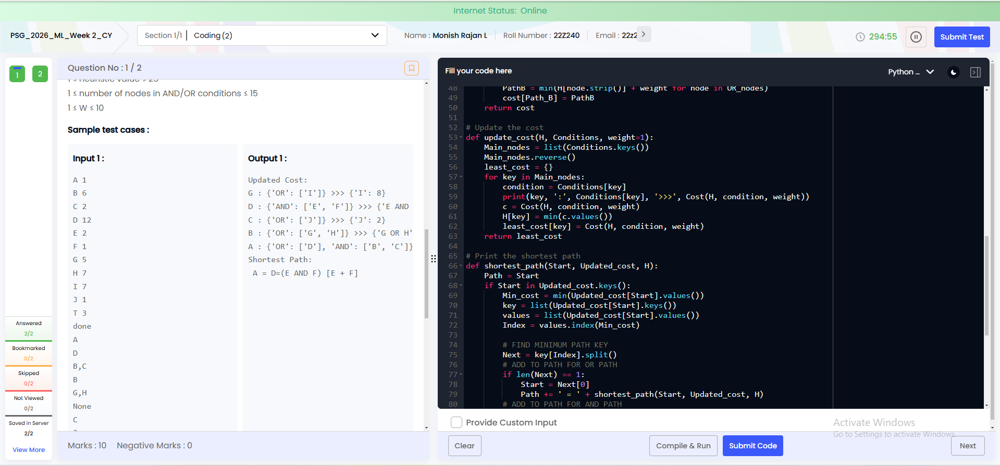

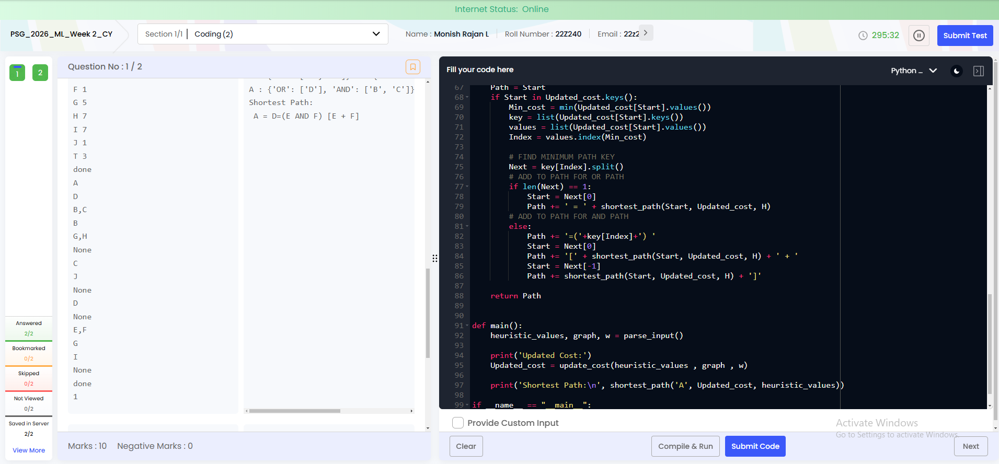

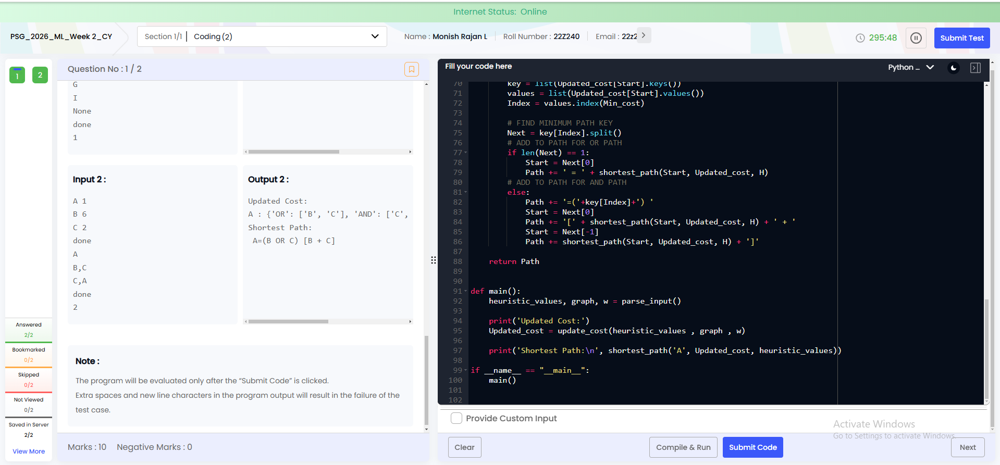

In [ ]:
# One test case is not passing

from collections import defaultdict

def parse_input():
    heuristic_values = {}
    while True:
        line = input().strip()
        if line.lower() == 'done':
            break
        node, h = line.split()
        node.strip()
        heuristic_values[node] = int(h)

    graph = {}

    while True:
        node = input().strip()

        if node.lower() == 'done':
            break

        or_conditions = input().strip()
        and_conditions = input().strip()

        temp2 = {}
        if or_conditions.lower() not in ["none" , ""]:
            temp2["OR"] = or_conditions.split(',')

        if and_conditions.lower() not in ["none", ""]:
            temp2["AND"] = and_conditions.split(',')

        graph[node] = temp2

    w = int(input().strip())
    return heuristic_values, graph, w

# Cost to find the AND and OR path
def Cost(H, condition, weight=1):
    cost = {}
    if 'AND' in condition:
        AND_nodes = condition['AND']
        Path_A = ' AND '.join(AND_nodes)
        PathA = sum(H[node.strip()] + weight for node in AND_nodes)
        cost[Path_A] = PathA

    if 'OR' in condition:
        OR_nodes = condition['OR']
        Path_B = ' OR '.join(OR_nodes)
        PathB = min(H[node.strip()] + weight for node in OR_nodes)
        cost[Path_B] = PathB
    return cost

# Update the cost
def update_cost(H, Conditions, weight=1):
    Main_nodes = list(Conditions.keys())
    Main_nodes.reverse()
    least_cost = {}
    for key in Main_nodes:
        condition = Conditions[key]
        print(key, ':', Conditions[key], '>>>', Cost(H, condition, weight))
        c = Cost(H, condition, weight)
        H[key] = min(c.values())
        least_cost[key] = Cost(H, condition, weight)
    return least_cost

# Print the shortest path
def shortest_path(Start, Updated_cost, H):
    Path = Start
    if Start in Updated_cost.keys():
        Min_cost = min(Updated_cost[Start].values())
        key = list(Updated_cost[Start].keys())
        values = list(Updated_cost[Start].values())
        Index = values.index(Min_cost)

        # FIND MINIMUM PATH KEY
        Next = key[Index].split()
        # ADD TO PATH FOR OR PATH
        if len(Next) == 1:
            Start = Next[0]
            Path += ' = ' + shortest_path(Start, Updated_cost, H)
        # ADD TO PATH FOR AND PATH
        else:
            Path += '=('+key[Index]+') '
            Start = Next[0]
            Path += '[' + shortest_path(Start, Updated_cost, H) + ' + '
            Start = Next[-1]
            Path += shortest_path(Start, Updated_cost, H) + ']'

    return Path


def main():
    heuristic_values, graph, w = parse_input()

    print('Updated Cost:')
    Updated_cost = update_cost(heuristic_values , graph , w)

    print('Shortest Path:\n', shortest_path('A', Updated_cost, heuristic_values))

if __name__ == "__main__":
    main()



#**Build Yourself - WEEK - 3**
**Question - 1**

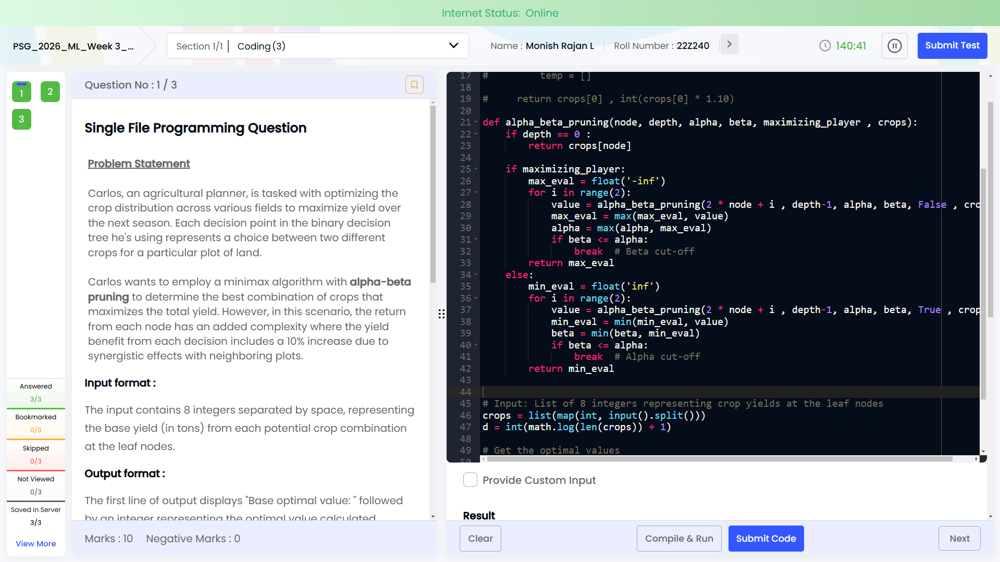
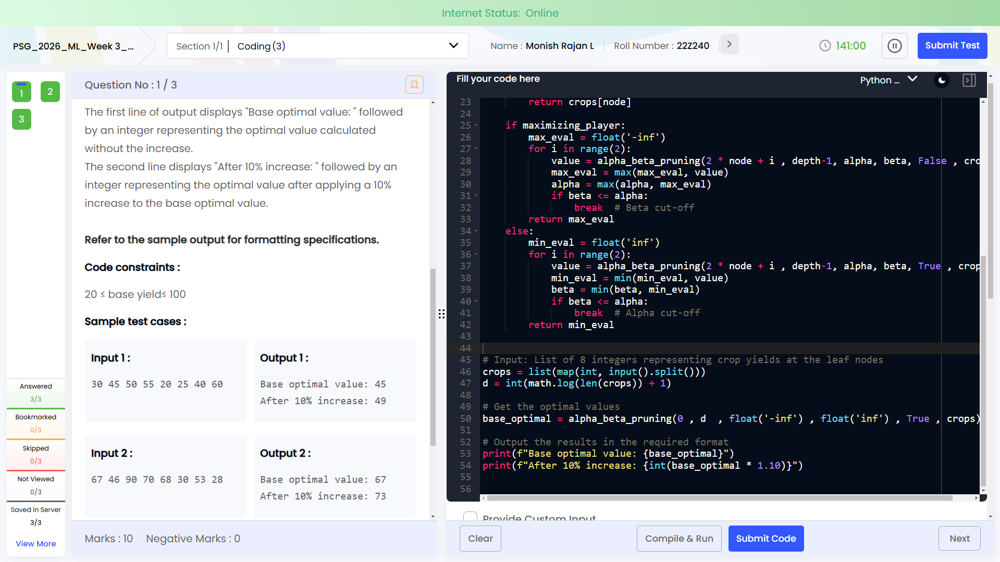



In [ ]:
import math

# def minimax_optimized(crops):
#     temp = []
#     for i in range(3):
#         j = 0
#         if i % 2 == 0:
#             while j < len(crops):
#                 temp.append(max(crops[j] , crops[j+1]))
#                 j += 2
#         else:
#             while j < len(crops):
#                 temp.append(min(crops[j] , crops[j+1]))
#                 j += 2

#         crops = temp[:]
#         temp = []

#     return crops[0] , int(crops[0] * 1.10)

def alpha_beta_pruning(node, depth, alpha, beta, maximizing_player , crops):
    if depth == 0 :
        return crops[node]

    if maximizing_player:
        max_eval = float('-inf')
        for i in range(2):
            value = alpha_beta_pruning(2 * node + i , depth-1, alpha, beta, False , crops)
            max_eval = max(max_eval, value)
            alpha = max(alpha, max_eval)
            if beta <= alpha:
                break  # Beta cut-off
        return max_eval
    else:
        min_eval = float('inf')
        for i in range(2):
            value = alpha_beta_pruning(2 * node + i , depth-1, alpha, beta, True , crops)
            min_eval = min(min_eval, value)
            beta = min(beta, min_eval)
            if beta <= alpha:
                break  # Alpha cut-off
        return min_eval


# Input: List of 8 integers representing crop yields at the leaf nodes
crops = list(map(int, input().split()))
d = int(math.log(len(crops)) + 1)

# Get the optimal values
base_optimal = alpha_beta_pruning(0 , d  , float('-inf') , float('inf') , True , crops)

# Output the results in the required format
print(f"Base optimal value: {base_optimal}")
print(f"After 10% increase: {int(base_optimal * 1.10)}")



**Question - 2**

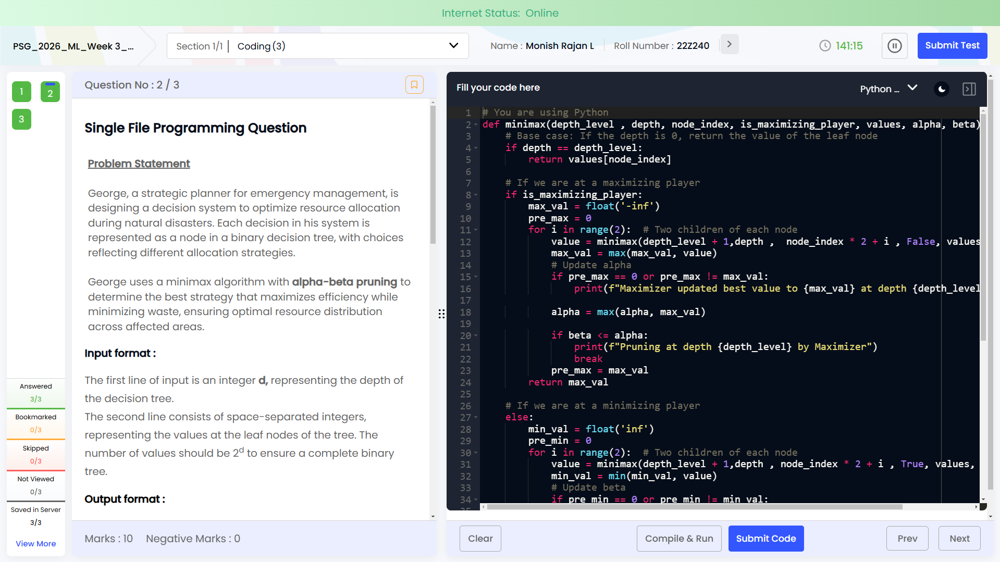

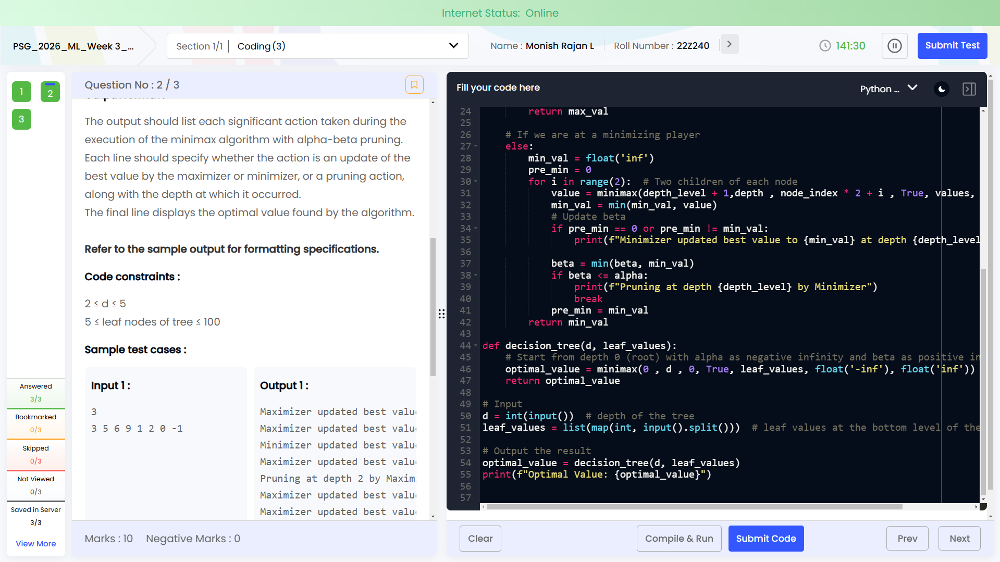
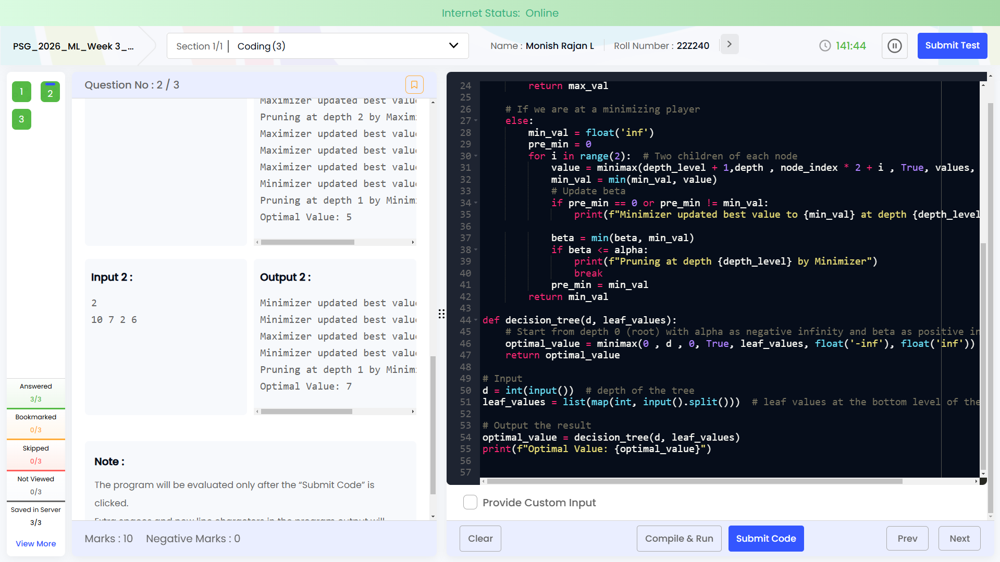



In [ ]:
# You are using Python
def minimax(depth_level , depth, node_index, is_maximizing_player, values, alpha, beta):
    # Base case: If the depth is 0, return the value of the leaf node
    if depth == depth_level:
        return values[node_index]

    # If we are at a maximizing player
    if is_maximizing_player:
        max_val = float('-inf')
        pre_max = 0
        for i in range(2):  # Two children of each node
            value = minimax(depth_level + 1,depth ,  node_index * 2 + i , False, values, alpha, beta)
            max_val = max(max_val, value)
            # Update alpha
            if pre_max == 0 or pre_max != max_val:
                print(f"Maximizer updated best value to {max_val} at depth {depth_level}")

            alpha = max(alpha, max_val)

            if beta <= alpha:
                print(f"Pruning at depth {depth_level} by Maximizer")
                break
            pre_max = max_val
        return max_val

    # If we are at a minimizing player
    else:
        min_val = float('inf')
        pre_min = 0
        for i in range(2):  # Two children of each node
            value = minimax(depth_level + 1,depth , node_index * 2 + i , True, values, alpha, beta)
            min_val = min(min_val, value)
            # Update beta
            if pre_min == 0 or pre_min != min_val:
                print(f"Minimizer updated best value to {min_val} at depth {depth_level}")

            beta = min(beta, min_val)
            if beta <= alpha:
                print(f"Pruning at depth {depth_level} by Minimizer")
                break
            pre_min = min_val
        return min_val

def decision_tree(d, leaf_values):
    # Start from depth 0 (root) with alpha as negative infinity and beta as positive infinity
    optimal_value = minimax(0 , d , 0, True, leaf_values, float('-inf'), float('inf'))
    return optimal_value

# Input
d = int(input())  # depth of the tree
leaf_values = list(map(int, input().split()))  # leaf values at the bottom level of the tree

# Output the result
optimal_value = decision_tree(d, leaf_values)
print(f"Optimal Value: {optimal_value}")



**Question - 3**

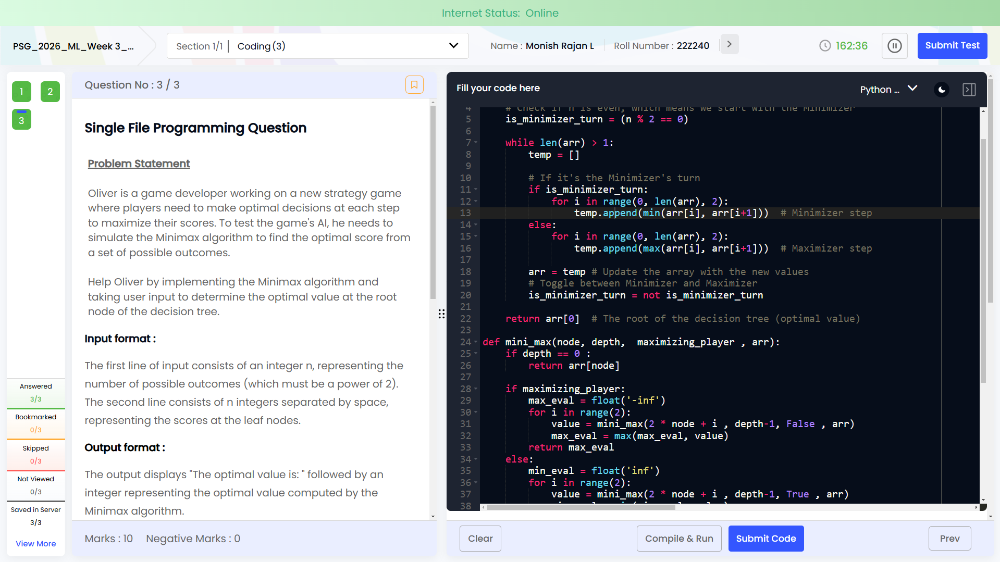

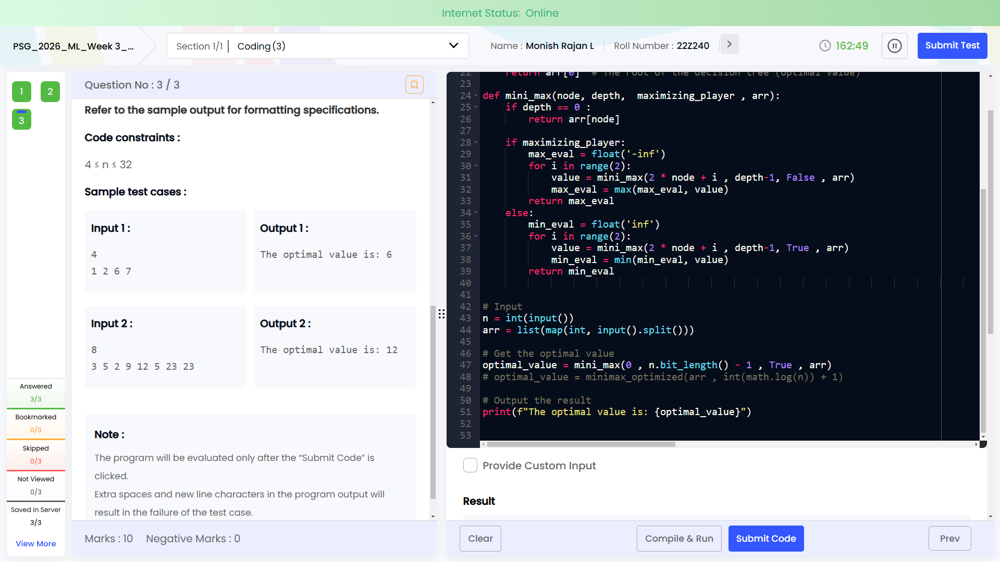


In [ ]:
import math

def minimax_optimized(arr, n):
    # Check if n is even, which means we start with the Minimizer
    is_minimizer_turn = (n % 2 == 0)

    while len(arr) > 1:
        temp = []

        # If it's the Minimizer's turn
        if is_minimizer_turn:
            for i in range(0, len(arr), 2):
                temp.append(min(arr[i], arr[i+1]))  # Minimizer step
        else:
            for i in range(0, len(arr), 2):
                temp.append(max(arr[i], arr[i+1]))  # Maximizer step

        arr = temp # Update the array with the new values
        # Toggle between Minimizer and Maximizer
        is_minimizer_turn = not is_minimizer_turn

    return arr[0]  # The root of the decision tree (optimal value)

def mini_max(node, depth,  maximizing_player , arr):
    if depth == 0 :
        return arr[node]

    if maximizing_player:
        max_eval = float('-inf')
        for i in range(2):
            value = mini_max(2 * node + i , depth-1, False , arr)
            max_eval = max(max_eval, value)
        return max_eval
    else:
        min_eval = float('inf')
        for i in range(2):
            value = mini_max(2 * node + i , depth-1, True , arr)
            min_eval = min(min_eval, value)
        return min_eval


# Input
n = int(input())
arr = list(map(int, input().split()))

# Get the optimal value
optimal_value = mini_max(0 , n.bit_length() - 1 , True , arr)
# optimal_value = minimax_optimized(arr , int(math.log(n)) + 1)

# Output the result
print(f"The optimal value is: {optimal_value}")



4
1 2 6 7
The optimal value is: 6


#**Challenge Yourself - WEEK - 3**

**Question - 1**

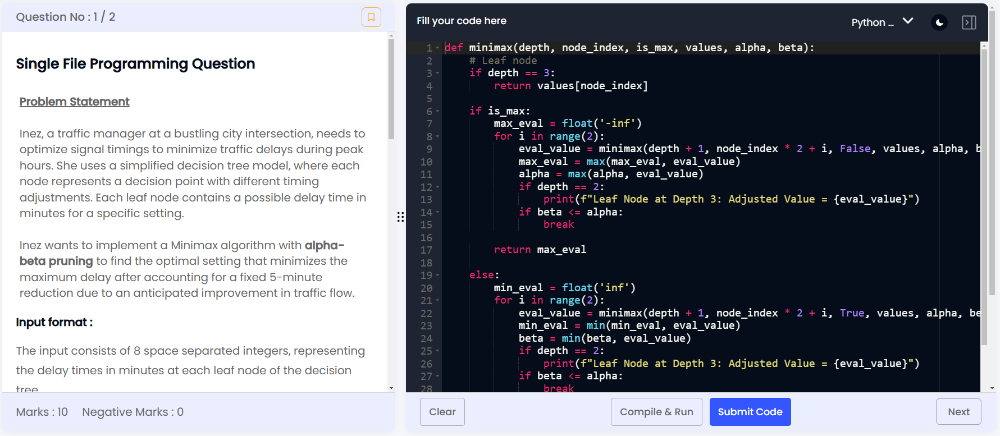

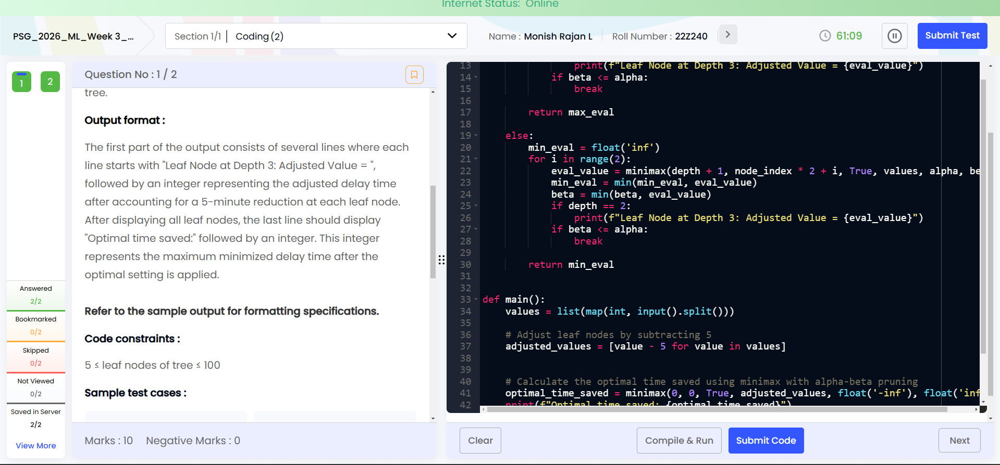

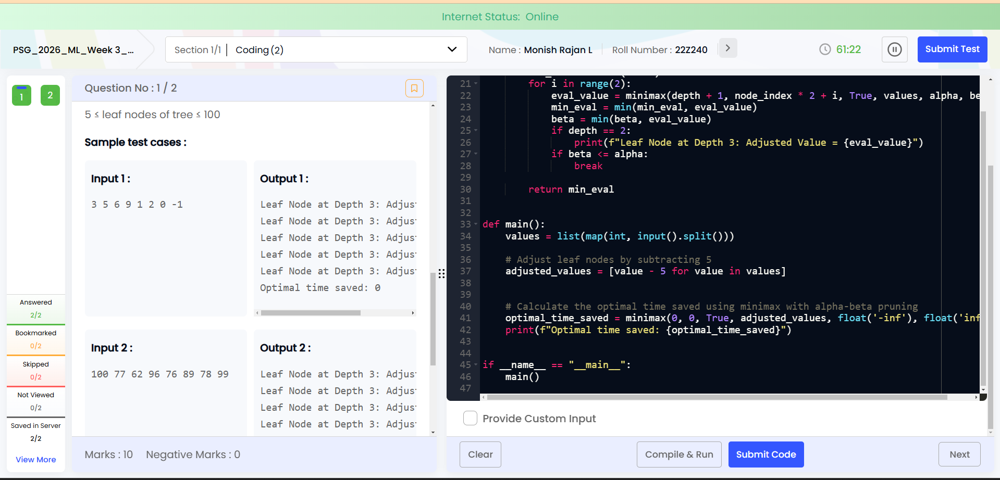



In [ ]:
def minimax(depth, node_index, is_max, values, alpha, beta):
    """
    Minimax function with alpha-beta pruning.

    :param depth: Current depth of the tree.
    :param node_index: Current index of the node in the tree.
    :param is_max: Boolean indicating if it's a maximizer's turn.
    :param values: List of leaf node values.
    :param alpha: Alpha value for pruning.
    :param beta: Beta value for pruning.
    :return: Optimal value.
    """
    # Leaf node
    if depth == 3:
        return values[node_index]

    if is_max:
        max_eval = float('-inf')
        for i in range(2):
            eval_value = minimax(depth + 1, node_index * 2 + i, False, values, alpha, beta)
            max_eval = max(max_eval, eval_value)
            alpha = max(alpha, eval_value)

            if depth == 2:
                print(f"Leaf Node at Depth 3: Adjusted Value = {eval_value}")
            if beta <= alpha:
                break
        return max_eval
    else:
        min_eval = float('inf')
        for i in range(2):
            eval_value = minimax(depth + 1, node_index * 2 + i, True, values, alpha, beta)
            min_eval = min(min_eval, eval_value)
            beta = min(beta, eval_value)

            if depth == 2:
                print(f"Leaf Node at Depth 3: Adjusted Value = {eval_value}")
            if beta <= alpha:
                break
        return min_eval


def main():
    values = list(map(int, input().split()))

    # Adjust leaf nodes by subtracting 5
    adjusted_values = [value - 5 for value in values]

    # Calculate the optimal time saved using minimax with alpha-beta pruning
    optimal_time_saved = minimax(0, 0, True, adjusted_values, float('-inf'), float('inf'))
    print(f"Optimal time saved: {optimal_time_saved}")


if __name__ == "__main__":
    main()


**Question - 2**
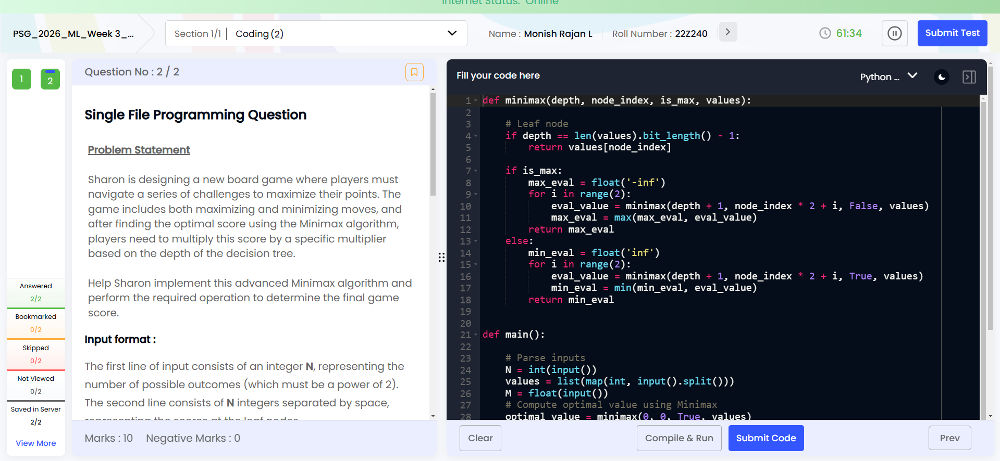

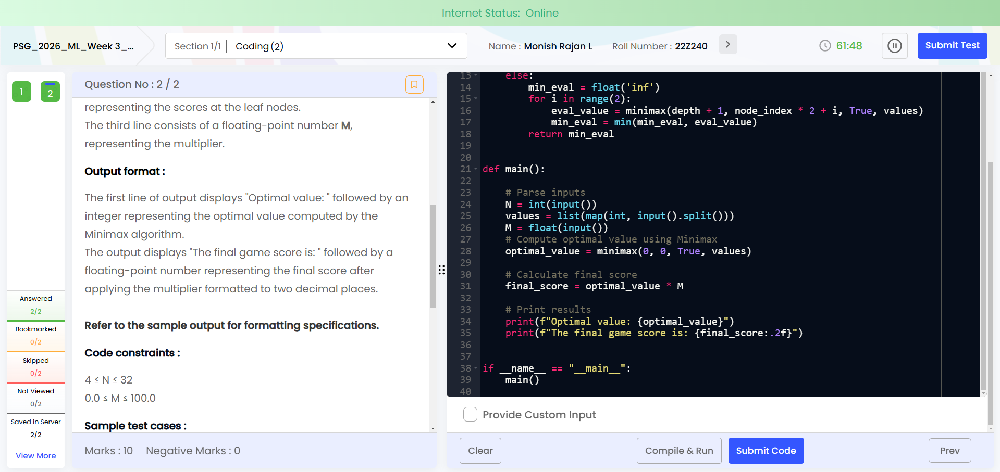

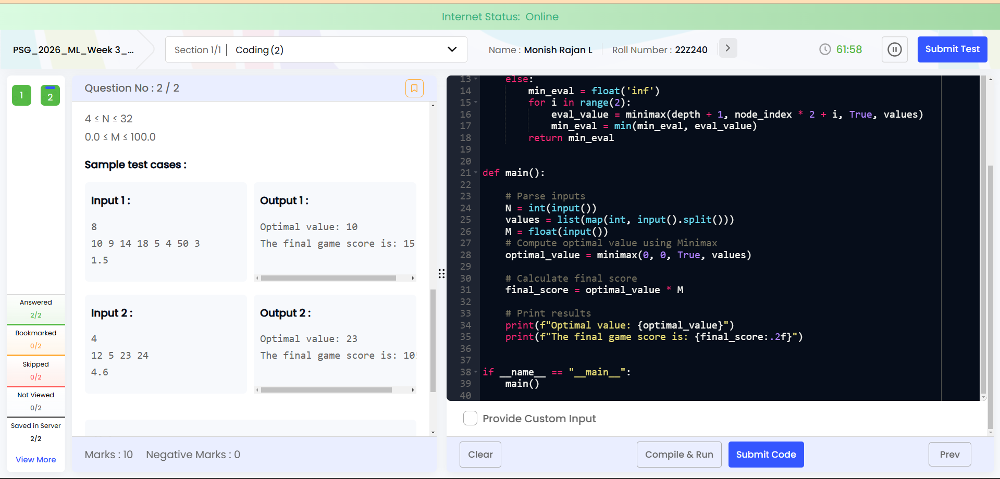


In [ ]:
def minimax(depth, node_index, is_max, values):
    # Leaf node
    if depth == len(values).bit_length() - 1:
        return values[node_index]

    if is_max:
        max_eval = float('-inf')
        for i in range(2):
            eval_value = minimax(depth + 1, node_index * 2 + i, False, values)
            max_eval = max(max_eval, eval_value)
        return max_eval
    else:
        min_eval = float('inf')
        for i in range(2):
            eval_value = minimax(depth + 1, node_index * 2 + i, True, values)
            min_eval = min(min_eval, eval_value)
        return min_eval


def main():

    # Parse inputs
    N = int(input())
    values = list(map(int, input().split()))
    M = float(input())

    # Compute optimal value using Minimax
    optimal_value = minimax(0, 0, True, values)

    # Calculate final score
    final_score = optimal_value * M

    # Print results
    print(f"Optimal value: {optimal_value}")
    print(f"The final game score is: {final_score:.2f}")


if __name__ == "__main__":
    main()


1
2
2.0
Optimal value: 2
The final game score is: 4.00


#**Build Yourself - WEEK - 4**

**Question - 1**

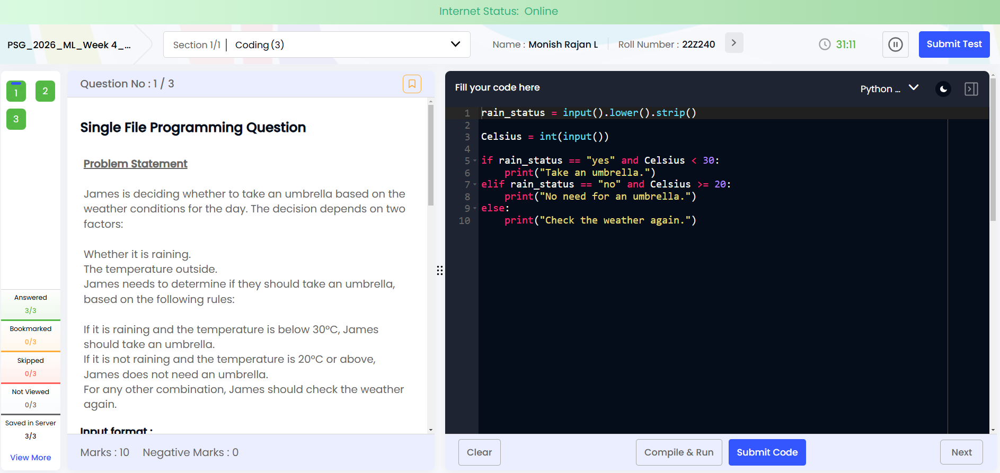

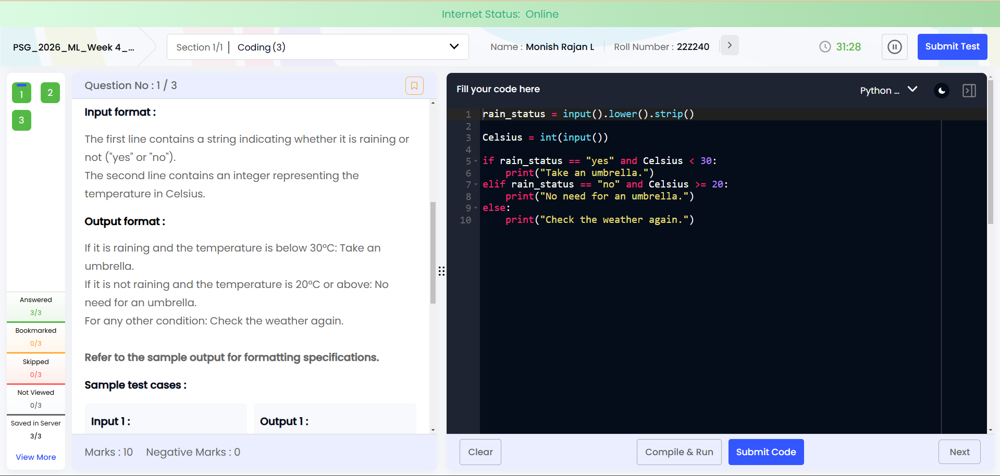

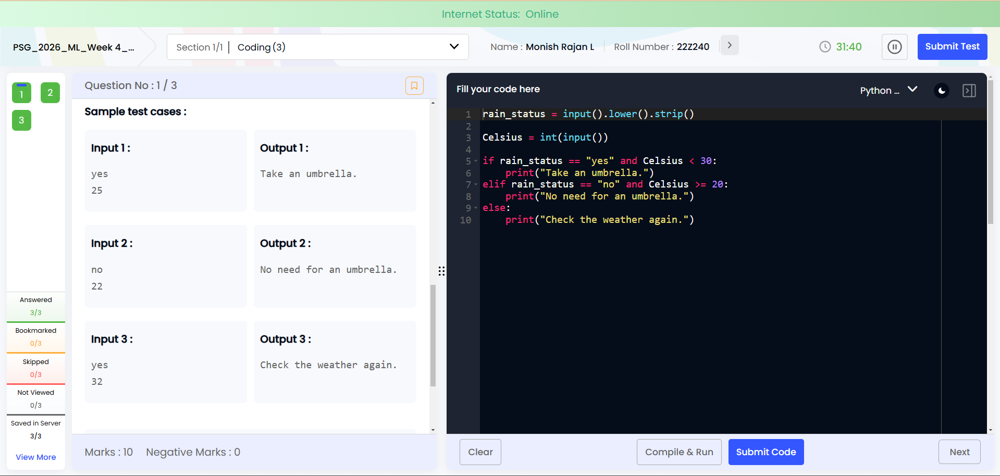


In [ ]:
rain_status = input().lower().strip()

Celsius = int(input())

if rain_status == "yes" and Celsius < 30:
    print("Take an umbrella.")
elif rain_status == "no" and Celsius >= 20:
    print("No need for an umbrella.")
else:
    print("Check the weather again.")

**Question - 2**

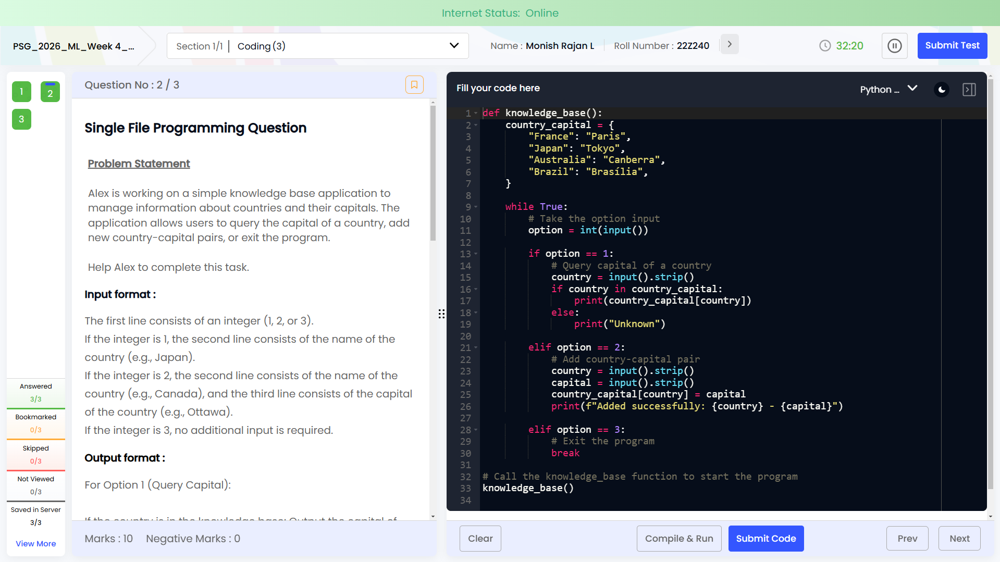

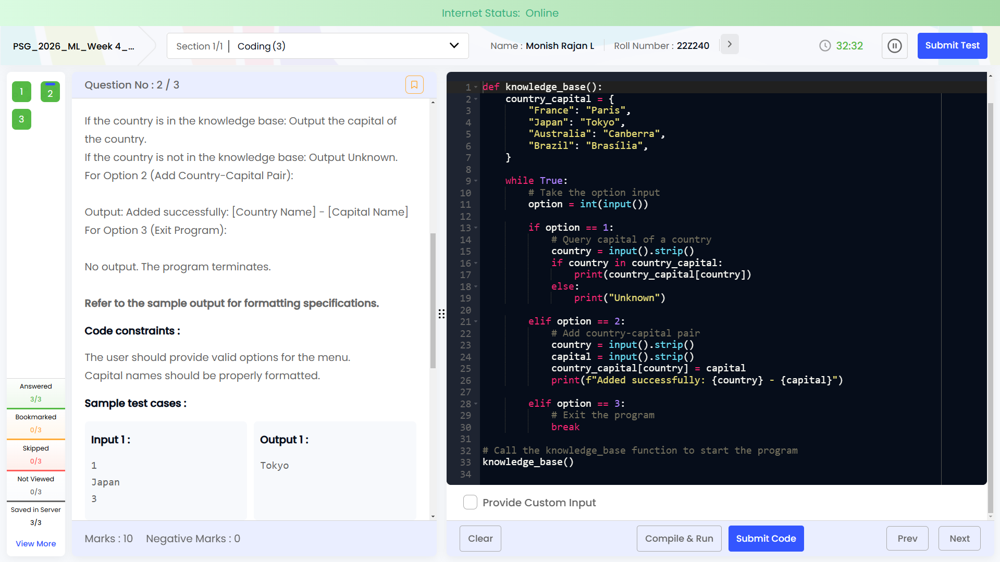

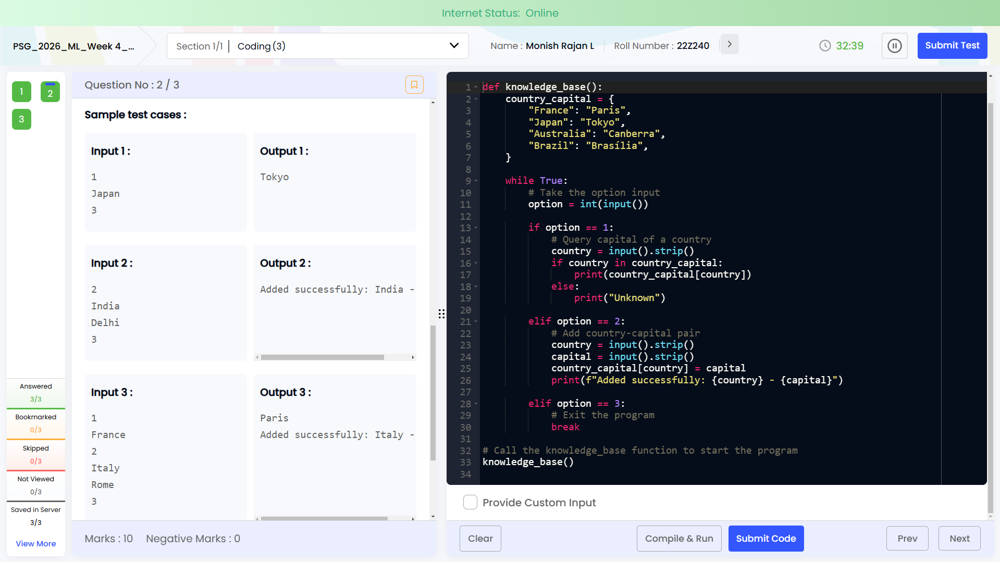


In [ ]:
def knowledge_base():
    country_capital = {
        "France": "Paris",
        "Japan": "Tokyo",
        "Australia": "Canberra",
        "Brazil": "Brasília",
    }

    while True:
        # Take the option input
        option = int(input())

        if option == 1:
            # Query capital of a country
            country = input().strip()
            if country in country_capital:
                print(country_capital[country])
            else:
                print("Unknown")

        elif option == 2:
            # Add country-capital pair
            country = input().strip()
            capital = input().strip()
            country_capital[country] = capital
            print(f"Added successfully: {country} - {capital}")

        elif option == 3:
            # Exit the program
            break

# Call the knowledge_base function to start the program
knowledge_base()


**Question - 3**

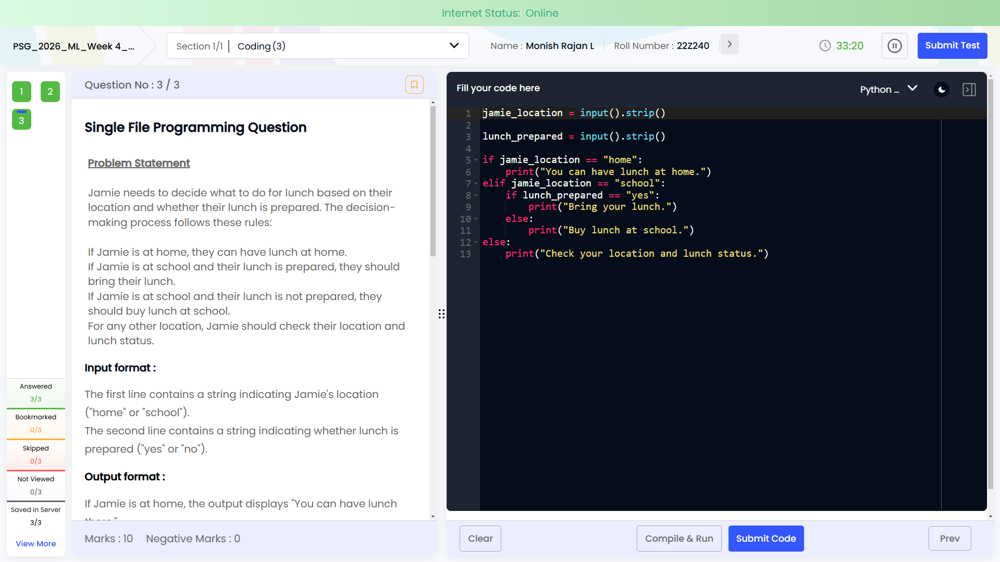

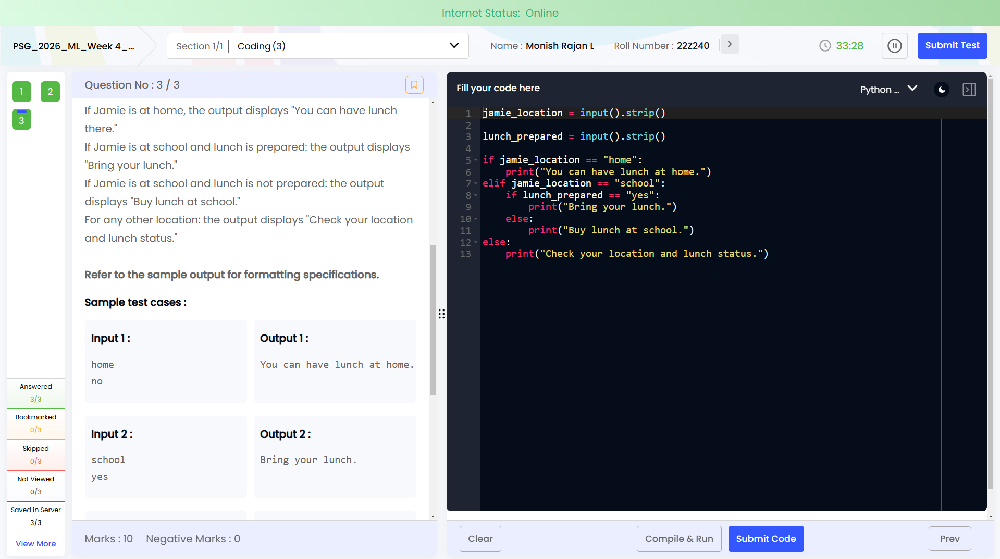

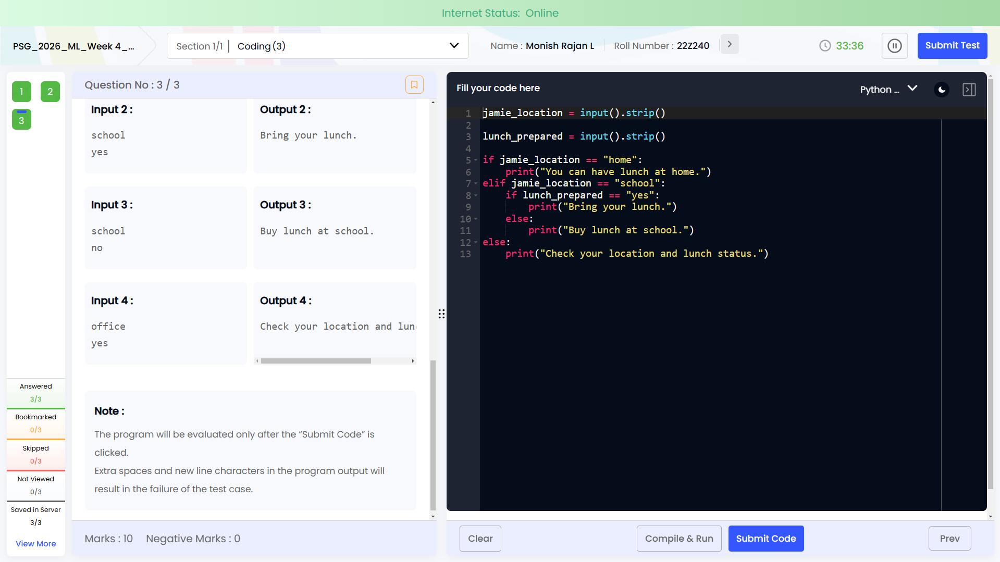

In [ ]:
jamie_location = input().strip()

lunch_prepared = input().strip()

if jamie_location == "home":
    print("You can have lunch at home.")
elif jamie_location == "school":
    if lunch_prepared == "yes":
        print("Bring your lunch.")
    else:
        print("Buy lunch at school.")
else:
    print("Check your location and lunch status.")

#**Challenge Yourself - WEEK - 4**

**Question - 1**

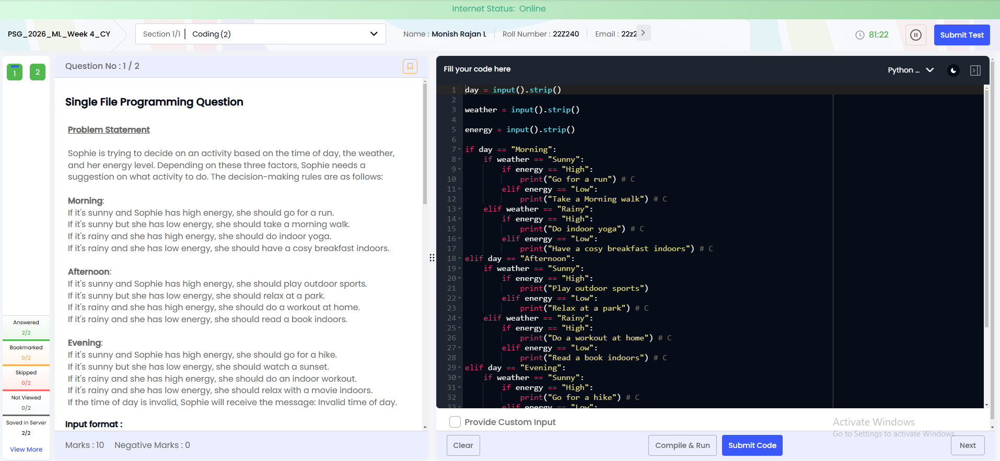

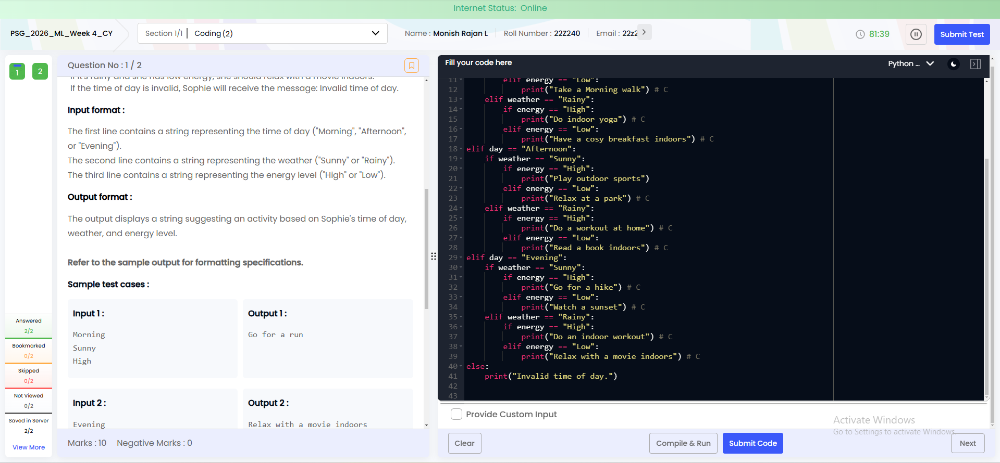

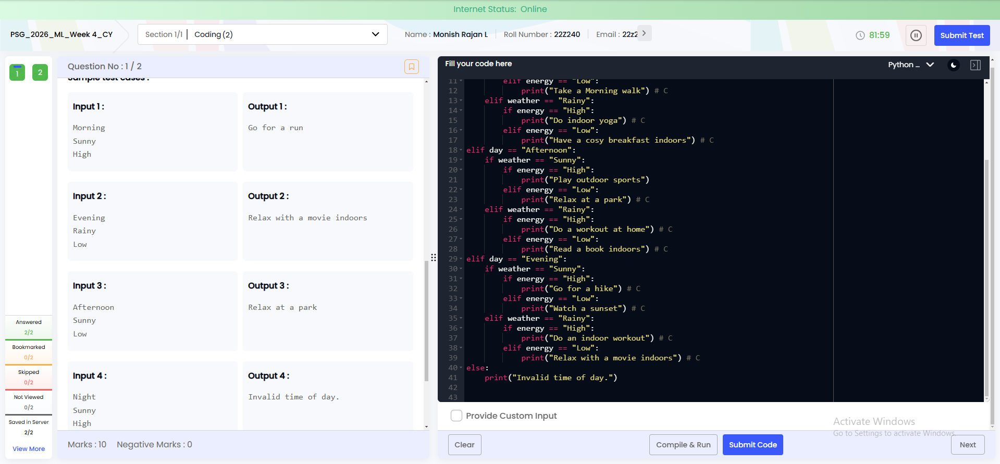


In [ ]:
day = input().strip()

weather = input().strip()

energy = input().strip()

if day == "Morning":
    if weather == "Sunny":
        if energy == "High":
            print("Go for a run") # C
        elif energy == "Low":
            print("Take a Morning walk") # C
    elif weather == "Rainy":
        if energy == "High":
            print("Do indoor yoga") # C
        elif energy == "Low":
            print("Have a cosy breakfast indoors") # C
elif day == "Afternoon":
    if weather == "Sunny":
        if energy == "High":
            print("Play outdoor sports")
        elif energy == "Low":
            print("Relax at a park") # C
    elif weather == "Rainy":
        if energy == "High":
            print("Do a workout at home") # C
        elif energy == "Low":
            print("Read a book indoors") # C
elif day == "Evening":
    if weather == "Sunny":
        if energy == "High":
            print("Go for a hike") # C
        elif energy == "Low":
            print("Watch a sunset") # C
    elif weather == "Rainy":
        if energy == "High":
            print("Do an indoor workout") # C
        elif energy == "Low":
            print("Relax with a movie indoors") # C
else:
    print("Invalid time of day.")



**Question - 2**
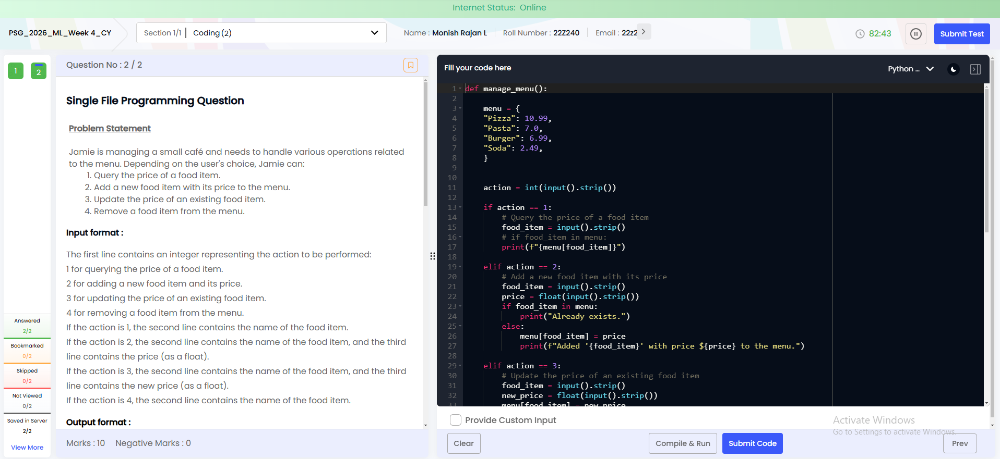

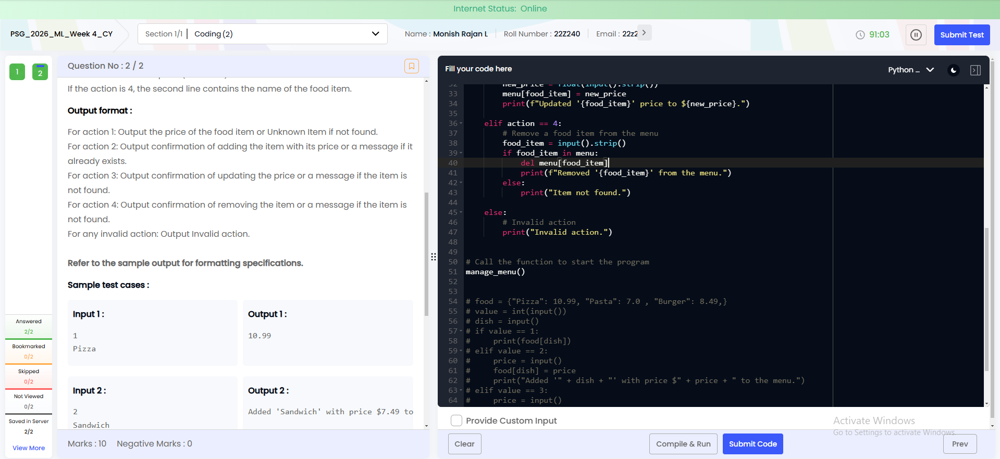

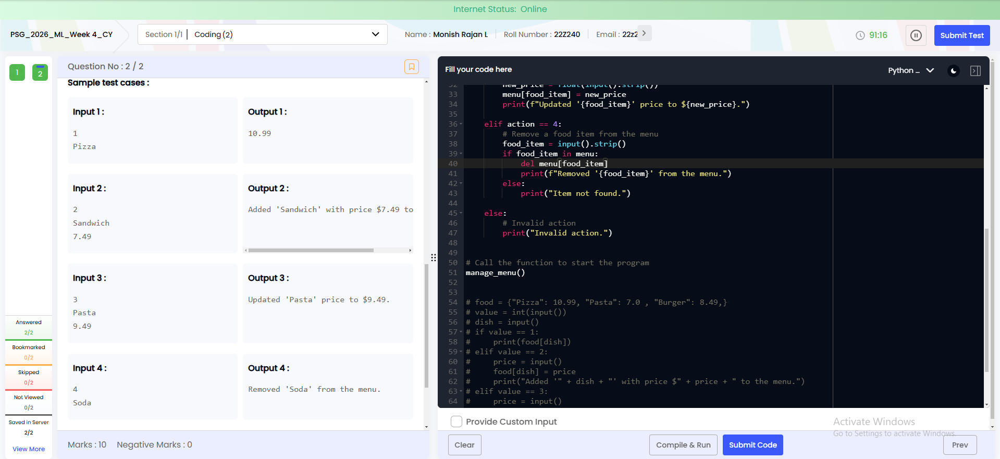



In [ ]:
def manage_menu():

    menu = {
    "Pizza": 10.99,
    "Pasta": 7.0,
    "Burger": 6.99,
    "Soda": 2.49,
    }


    action = int(input().strip())

    if action == 1:
        # Query the price of a food item
        food_item = input().strip()
        # if food_item in menu:
        print(f"{menu[food_item]}")

    elif action == 2:
        # Add a new food item with its price
        food_item = input().strip()
        price = float(input().strip())
        if food_item in menu:
            print("Already exists.")
        else:
            menu[food_item] = price
            print(f"Added '{food_item}' with price ${price} to the menu.")

    elif action == 3:
        # Update the price of an existing food item
        food_item = input().strip()
        new_price = float(input().strip())
        menu[food_item] = new_price
        print(f"Updated '{food_item}' price to ${new_price}.")

    elif action == 4:
        # Remove a food item from the menu
        food_item = input().strip()
        if food_item in menu:
            del menu[food_item]
            print(f"Removed '{food_item}' from the menu.")
        else:
            print("Item not found.")

    else:
        # Invalid action
        print("Invalid action.")


# Call the function to start the program
manage_menu()


# food = {"Pizza": 10.99, "Pasta": 7.0 , "Burger": 8.49,}
# value = int(input())
# dish = input()
# if value == 1:
#     print(food[dish])
# elif value == 2:
#     price = input()
#     food[dish] = price
#     print("Added '" + dish + "' with price $" + price + " to the menu.")
# elif value == 3:
#     price = input()
#     food[dish] = price
#     print("Updated '" + dish + "' price to $" + price + ".")
# elif value == 4:
#     print("Removed '" + dish + "' from the menu.")


